## Import all packages

In [161]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from statsmodels.tsa.seasonal import seasonal_decompose
import numpy as np

## Load NEM Data

The following code represent an exploratory analysis of the AEM Price, Demand and Solar Generation data.

In [162]:
# Load CSV of NEM Data

# Load Regional Dispatch Price, Demand and Solar Max Capacity (Half Hourly)
data = pd.read_csv('NEMreview - Untitled - 5th Mar 2024, 19_00 UTC+10.csv')

# See what type of data exists
data.head()

,Time (UTC+10),Regions QLD Dispatch Price ($/MWh),Regions NSW Dispatch Price ($/MWh),Regions VIC Dispatch Price ($/MWh),Regions SA Dispatch Price ($/MWh),Regions TAS Dispatch Price ($/MWh),Regions QLD Dispatch Total Demand (MW),Regions NSW Dispatch Total Demand (MW),Regions VIC Dispatch Total Demand (MW),Regions SA Dispatch Total Demand (MW),Regions TAS Dispatch Total Demand (MW),Large Solar NSW1 Final MW (MW),Large Solar QLD1 Final MW (MW),Large Solar SA1 Final MW (MW),Large Solar VIC1 Final MW (MW),Large Solar NSW1 Max Capacity (MW),Large Solar QLD1 Max Capacity (MW),Large Solar SA1 Max Capacity (MW),Large Solar VIC1 Max Capacity (MW)
0,01-Jan-2013 00:30,44.514880,46.609072,43.311567,46.811315,2183.835787,5260.281667,7166.965000,4652.875000,1514.071667,777.938333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01-Jan-2013 01:00,43.747105,46.315808,42.856647,46.058280,41.305392,5154.603333,6928.113333,4447.733333,1446.946667,856.773333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01-Jan-2013 01:30,41.632880,44.764830,41.637855,43.929600,39.725528,4983.321667,6541.210000,4487.475000,1338.016667,856.830000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01-Jan-2013 02:00,39.782027,42.858237,39.835352,42.545670,37.728343,4881.883333,6253.600000,4329.873333,1258.223333,841.155000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01-Jan-2013 02:30,38.972580,42.857285,39.528360,42.241247,37.752998,4776.313333,6003.443333,4162.360000,1240.188333,849.460000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## General Exploration

For each region, three key variables are plotted on its respective subplot:

- Electricity Price: Indicated in blue, this line shows the price of electricity per megawatt-hour (MWh) for the region.
- Total Electricity Demand: Depicted in green with a dashed line, this represents the total power consumption in the region, measured in megawatts (MW).
- Solar Generation: If available, solar generation data is plotted in yellow with a dash-dot line, highlighting the output from large-scale solar installations in the region, also in megawatts (MW).

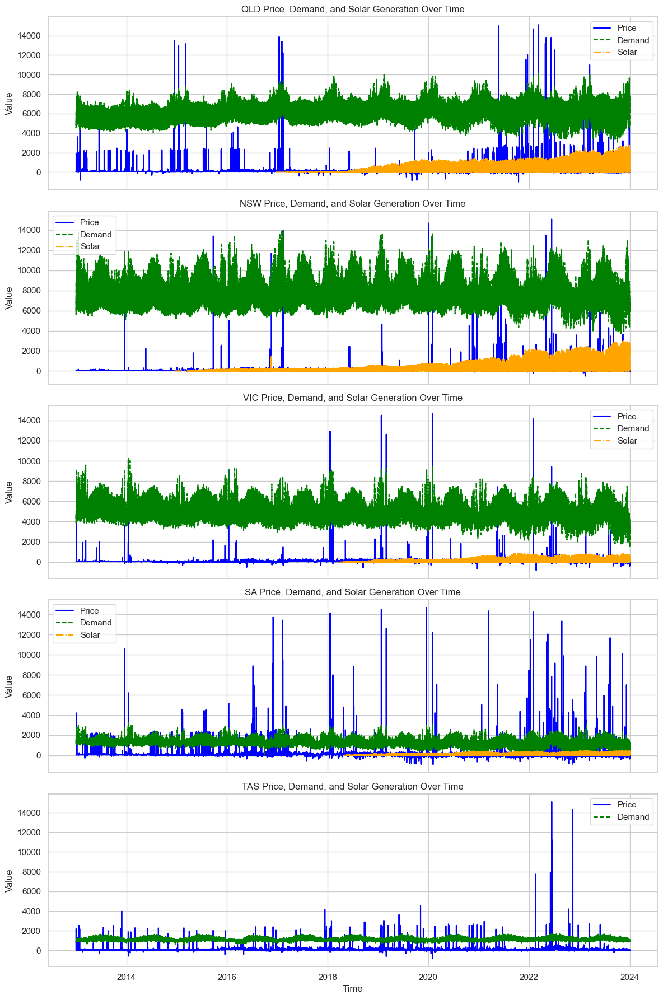

In [163]:
## Plot Price, demand and solar over time.

# Convert the 'Time (UTC+10)' column to datetime format for easier plotting
data['Time (UTC+10)'] = pd.to_datetime(data['Time (UTC+10)'])

# Define the regions
regions = ['QLD', 'NSW', 'VIC', 'SA', 'TAS']

# Setup the plot
fig, axs = plt.subplots(len(regions), 1, figsize=(12, 18), sharex=True)

for i, region in enumerate(regions):
    # Plotting price
    price_column = f'Regions {region} Dispatch Price ($/MWh)'
    axs[i].plot(data['Time (UTC+10)'], data[price_column], label='Price', color='blue')
    
    # Plotting demand
    demand_column = f'Regions {region} Dispatch Total Demand (MW)'
    axs[i].plot(data['Time (UTC+10)'], data[demand_column], label='Demand', color='green', linestyle='--')
    
    # Check for solar data and plot if available
    solar_column = f'Large Solar {region}1 Final MW (MW)'
    if solar_column in data.columns and data[solar_column].notna().any():
        axs[i].plot(data['Time (UTC+10)'], data[solar_column], label='Solar', color='orange', linestyle='-.')
    
    axs[i].set_title(f'{region} Price, Demand, and Solar Generation Over Time')
    axs[i].legend()
    axs[i].set_ylabel('Value')

# Improve layout and set x-axis label
plt.xlabel('Time')
plt.tight_layout()
plt.show()

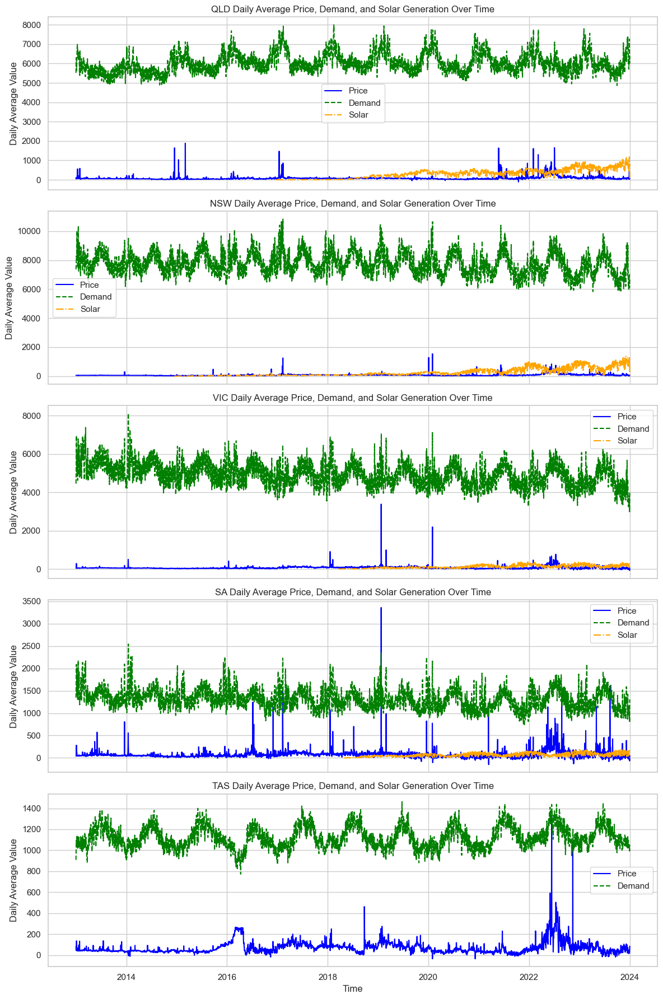

In [164]:
# Resample the data to get daily averages
daily_data = data.resample('D', on='Time (UTC+10)').mean()

# Setup the plot
fig, axs = plt.subplots(len(regions), 1, figsize=(12, 18), sharex=True)

for i, region in enumerate(regions):
    # Plotting daily average price
    price_column = f'Regions {region} Dispatch Price ($/MWh)'
    axs[i].plot(daily_data.index, daily_data[price_column], label='Price', color='blue')
    
    # Plotting daily average demand
    demand_column = f'Regions {region} Dispatch Total Demand (MW)'
    axs[i].plot(daily_data.index, daily_data[demand_column], label='Demand', color='green', linestyle='--')
    
    # Check for solar data and plot if available
    solar_column = f'Large Solar {region}1 Final MW (MW)'
    if solar_column in daily_data.columns and daily_data[solar_column].notna().any():
        axs[i].plot(daily_data.index, daily_data[solar_column], label='Solar', color='orange', linestyle='-.')
    
    axs[i].set_title(f'{region} Daily Average Price, Demand, and Solar Generation Over Time')
    axs[i].legend()
    axs[i].set_ylabel('Daily Average Value')

# Improve layout and set x-axis label
plt.xlabel('Time')
plt.tight_layout()
plt.show()

## Price vs Demand

For each region, a scatter plot is generated that depicts the relationship between the daily average demand (in Megawatts, MW) and the daily average price (in $/MWh).

A subplot is created for each region, allowing for a comparative analysis across the regions. On each subplot:

- Demand is plotted on the x-axis.
- Price is plotted on the y-axis.
- Each point in the scatter plot represents the daily averaged data, with the point's opacity set to a level that ensures visibility of data point density.

Additionally, for each region, the Pearson correlation coefficient is calculated to quantify the linear relationship between demand and price.

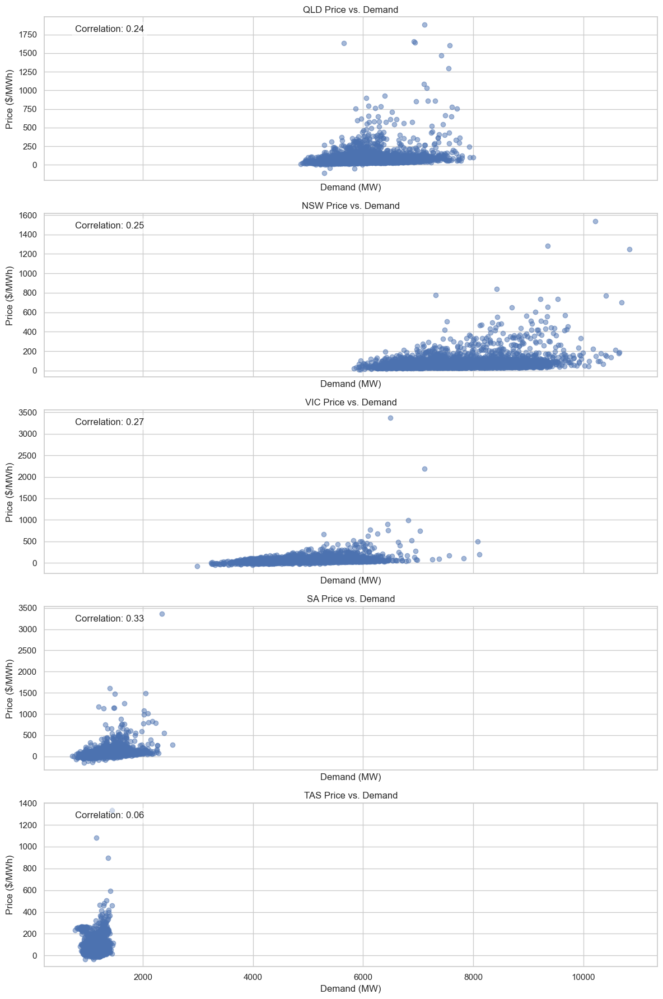

In [165]:
# Setup the plot
fig, axs = plt.subplots(len(regions), 1, figsize=(12, 18), sharex=True)

for i, region in enumerate(regions):
    # Extract price and demand for the region
    price_column = f'Regions {region} Dispatch Price ($/MWh)'
    demand_column = f'Regions {region} Dispatch Total Demand (MW)'
    price = daily_data[price_column]
    demand = daily_data[demand_column]
    
    # Scatter plot of demand vs. price
    axs[i].scatter(demand, price, alpha=0.5)
    axs[i].set_title(f'{region} Price vs. Demand')
    axs[i].set_xlabel('Demand (MW)')
    axs[i].set_ylabel('Price ($/MWh)')
    
    # Calculate and display the Pearson correlation coefficient
    correlation_coef, _ = pearsonr(demand, price)
    axs[i].text(0.05, 0.95, f'Correlation: {correlation_coef:.2f}', transform=axs[i].transAxes, ha="left", va="top", 
                bbox=dict(boxstyle="round", alpha=0.5, color='white'))
    
# Improve layout
plt.tight_layout()
plt.show()

## Monthly Trends

Resampling data to reduce noise to visually identify long term trends and seasonality.

Now repeat the same plots as previous sections.

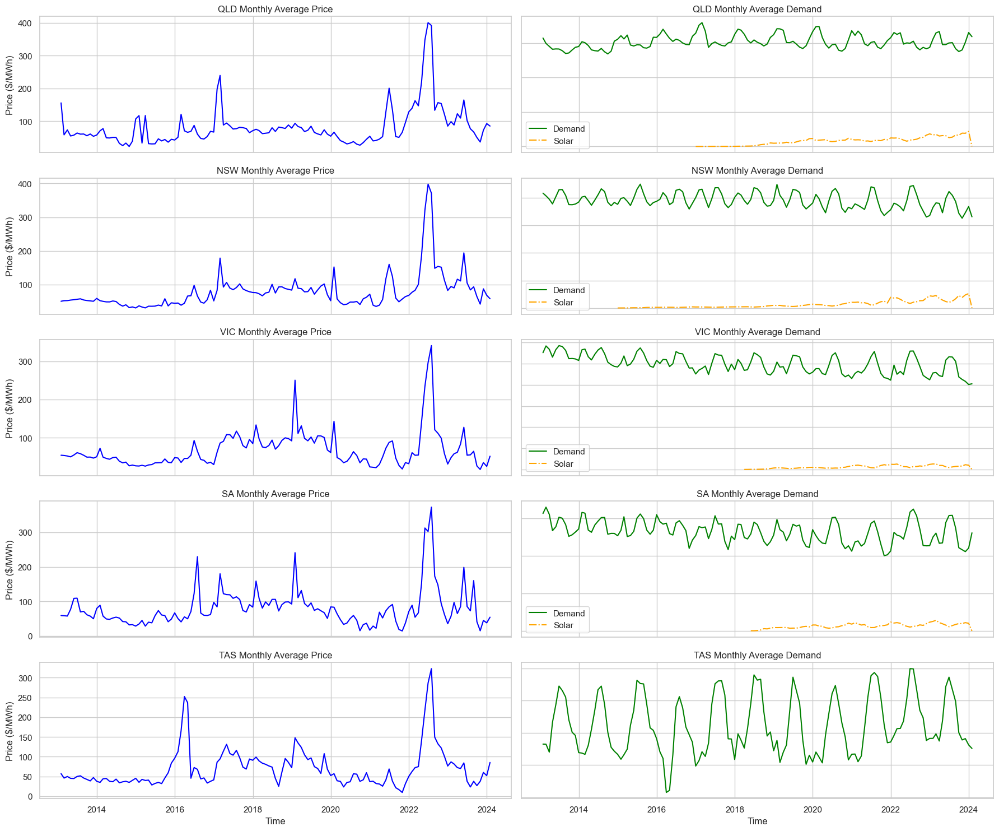

In [166]:
# Resample the data to get monthly averages
monthly_data = data.resample('M', on='Time (UTC+10)').mean()

# Setup the plot
fig, axs = plt.subplots(len(regions), 2, figsize=(18, 15), sharex=True)

for i, region in enumerate(regions):
    # Monthly average price
    price_column = f'Regions {region} Dispatch Price ($/MWh)'
    axs[i, 0].plot(monthly_data.index, monthly_data[price_column], label='Price', color='blue')
    axs[i, 0].set_title(f'{region} Monthly Average Price')
    axs[i, 0].set_ylabel('Price ($/MWh)')
    
    # Monthly average demand
    demand_column = f'Regions {region} Dispatch Total Demand (MW)'
    axs[i, 1].plot(monthly_data.index, monthly_data[demand_column], label='Demand', color='green')
    axs[i, 1].set_title(f'{region} Monthly Average Demand')
    axs[i, 1].set_ylabel('Demand (MW)')
    
    # Check for solar data and add it to the demand plot if available
    solar_column = f'Large Solar {region}1 Final MW (MW)'
    if solar_column in monthly_data.columns and monthly_data[solar_column].notna().any():
        axs[i, 1].plot(monthly_data.index, monthly_data[solar_column], label='Solar', color='orange', linestyle='-.')
        axs[i, 1].legend()

# Improve layout and set x-axis label
for ax in axs.flat:
    ax.set_xlabel('Time')
    ax.label_outer()

fig.tight_layout()
plt.show()

## Seasonal Decomposition

To delve deeper into the nuances of electricity market dynamics within Queensland (focusing on a single state for now), I applied seasonal decomposition to both the monthly average price and demand data. This technique enables the disentangling of data into its fundamental components: trend, seasonality, and residual noise. By isolating these elements, we can gain insights into underlying patterns and irregularities that might influence market behavior.


Following the price analysis, I similarly decomposed the monthly average demand for QLD. Demand in the electricity market is inherently interesting due to its responsiveness to a myriad of factors, including weather conditions, economic activities, and consumer behavior. The decomposition of demand data, again using an additive model, provides a clear visualization of these influences over time.

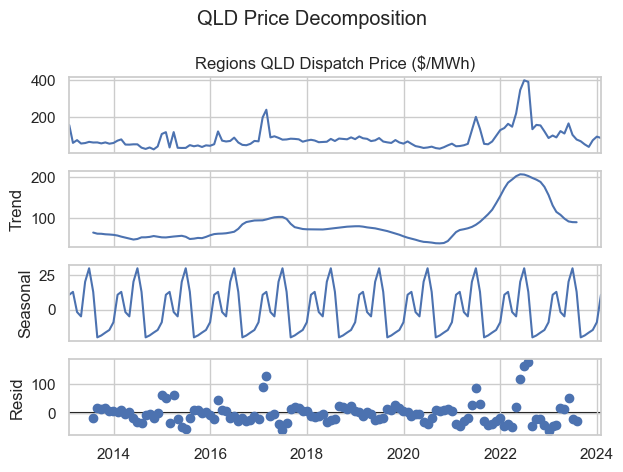

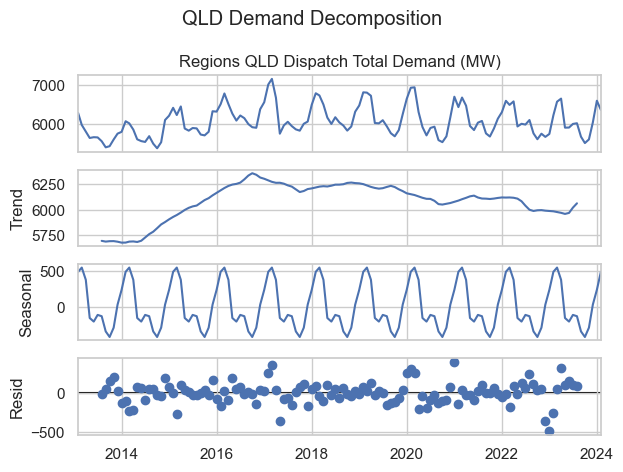

In [167]:
# Choose a region for the example
region = 'QLD'

# Perform seasonal decomposition on Monthly Average Price for the chosen region
price_column = f'Regions {region} Dispatch Price ($/MWh)'
price_decompose = seasonal_decompose(monthly_data[price_column].dropna(), model='additive')

# Perform seasonal decomposition on Monthly Average Demand for the chosen region
demand_column = f'Regions {region} Dispatch Total Demand (MW)'
demand_decompose = seasonal_decompose(monthly_data[demand_column].dropna(), model='additive')

# Plotting the decomposition results for Price
price_decompose.plot()
plt.suptitle(f'{region} Price Decomposition')
plt.tight_layout()

# Plotting the decomposition results for Demand
demand_decompose.plot()
plt.suptitle(f'{region} Demand Decomposition')
plt.tight_layout()

plt.show()

## Price and Demand Heatmap

Plotting price and demand heatmaps to further understand the influence of seasonality and the relationship between the two variables.







/var/folders/6d/402nhvmn6gs6bk9gc89q7gy40000gn/T/ipykernel_1448/4261114261.py:9: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  price_pivot = monthly_data.pivot("Year", "Month", f'Regions {region} Dispatch Price ($/MWh)')
/var/folders/6d/402nhvmn6gs6bk9gc89q7gy40000gn/T/ipykernel_1448/4261114261.py:10: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  demand_pivot = monthly_data.pivot("Year", "Month", f'Regions {region} Dispatch Total Demand (MW)')


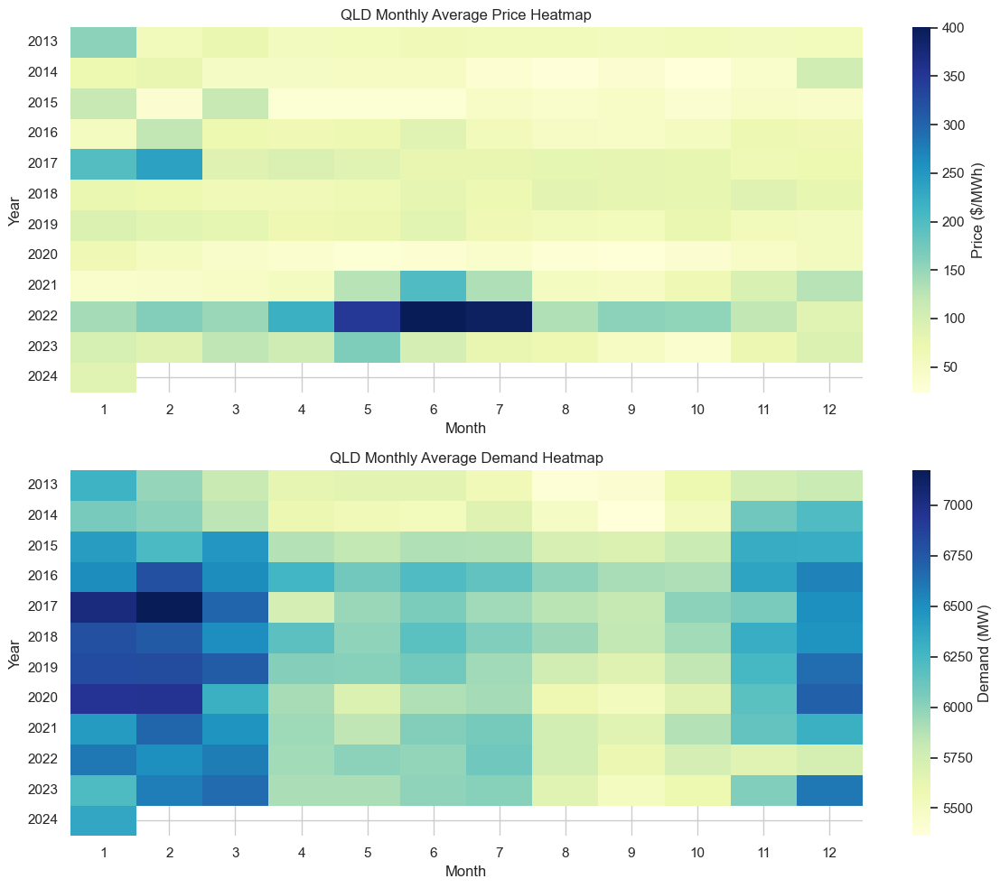

In [168]:
# Prepare data for heatmap - let's use QLD as an example region again
region = 'QLD'

# Extract month and year from the index
monthly_data['Year'] = monthly_data.index.year
monthly_data['Month'] = monthly_data.index.month

# Pivot tables for heatmaps
price_pivot = monthly_data.pivot("Year", "Month", f'Regions {region} Dispatch Price ($/MWh)')
demand_pivot = monthly_data.pivot("Year", "Month", f'Regions {region} Dispatch Total Demand (MW)')

# Setup the plot
fig, axs = plt.subplots(2, 1, figsize=(12, 10))

# Price heatmap
sns.heatmap(price_pivot, cmap="YlGnBu", ax=axs[0], cbar_kws={'label': 'Price ($/MWh)'})
axs[0].set_title(f'{region} Monthly Average Price Heatmap')
axs[0].set_xlabel('Month')
axs[0].set_ylabel('Year')

# Demand heatmap
sns.heatmap(demand_pivot, cmap="YlGnBu", ax=axs[1], cbar_kws={'label': 'Demand (MW)'})
axs[1].set_title(f'{region} Monthly Average Demand Heatmap')
axs[1].set_xlabel('Month')
axs[1].set_ylabel('Year')

plt.tight_layout()
plt.show()

## Year Over Year Change in Demand

I plotted these YoY changes using a heatmap, which provided a color-coded view of the percentage changes, with the color intensity indicating the magnitude of increase or decrease in demand.

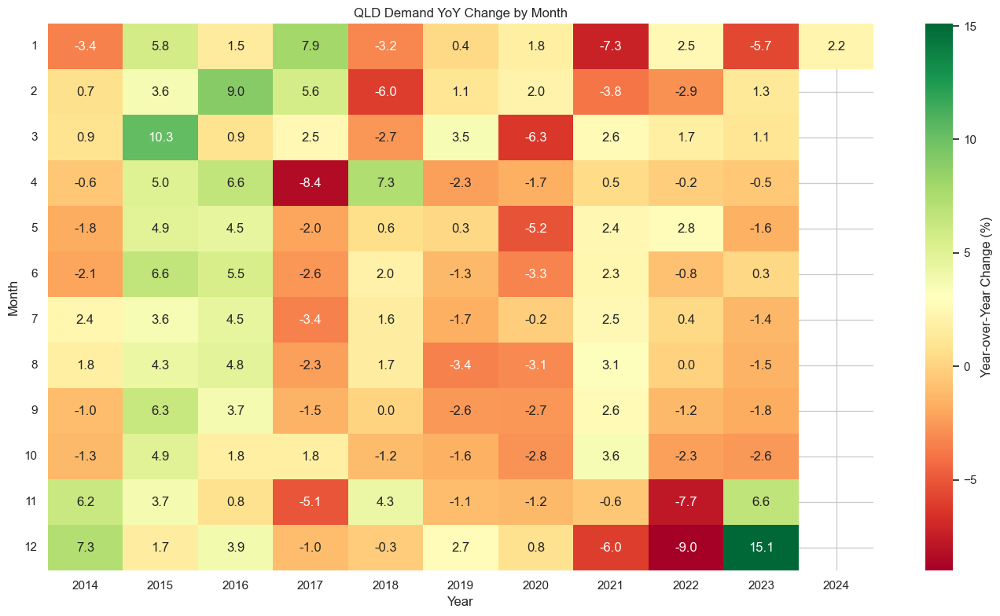

In [169]:
# For the YoY comparison, let's use QLD and focus on demand as an example
region = 'QLD'
variable = f'Regions {region} Dispatch Total Demand (MW)'

# Calculate YoY change for each month
monthly_data['YoY Change'] = monthly_data[variable].pct_change(12) * 100  # percent change from the same month previous year

# Prepare data for plotting
yoy_pivot = monthly_data.pivot_table(values='YoY Change', index='Month', columns='Year')

# Plot YoY changes
plt.figure(figsize=(14, 8))
sns.heatmap(yoy_pivot, cmap="RdYlGn", annot=True, fmt=".1f", cbar_kws={'label': 'Year-over-Year Change (%)'})
plt.title(f'{region} Demand YoY Change by Month')
plt.xlabel('Year')
plt.ylabel('Month')
plt.yticks(np.arange(0.5, len(yoy_pivot.index), 1), yoy_pivot.index, rotation=0)  # Adjust y-ticks to show month names
plt.tight_layout()
plt.show()

## Influence of weekdays and weekends on demand and pricing



In an effort to understand the variations in electricity demand and pricing within Queensland based on different days of the week, I classified each day as either a weekday or a weekend. This classification was achieved by analyzing the 'Time (UTC+10)' column, where days from Monday to Friday were labeled as 'Weekday' and Saturday and Sunday as 'Weekend'.

Following this categorization, I aggregated the data by this new 'Day Type' distinction, focusing on QLD. The aggregation aimed to calculate the average total demand in megawatts (MW) and the average dispatch price in dollars per megawatt-hour ($/MWh) for weekdays and weekends, providing a clear comparison between these two types of days.

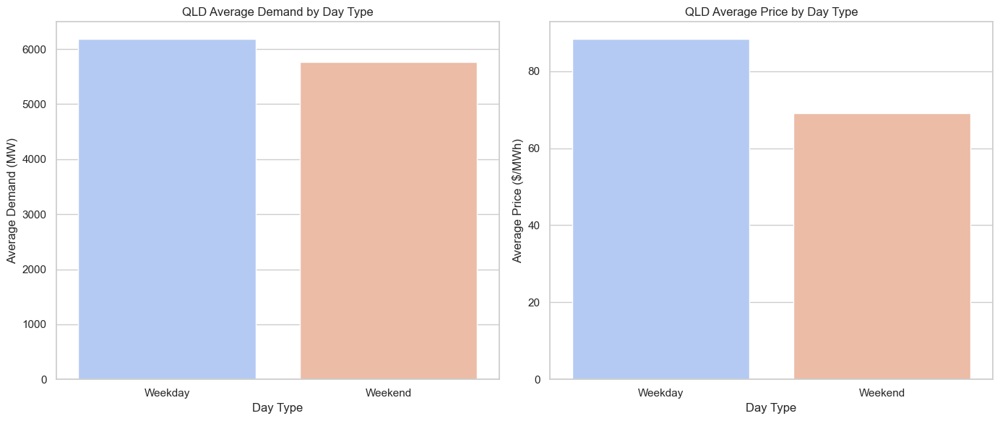

In [170]:
# Classify days into weekdays and weekends
data['Day Type'] = data['Time (UTC+10)'].dt.dayofweek.apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')

# Aggregate data by day type for QLD region
day_type_agg = data.groupby('Day Type').agg({f'Regions {region} Dispatch Total Demand (MW)': 'mean',
                                             f'Regions {region} Dispatch Price ($/MWh)': 'mean'}).reset_index()

# Plotting
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Average Demand by Day Type
sns.barplot(x='Day Type', y=f'Regions {region} Dispatch Total Demand (MW)', data=day_type_agg, ax=axs[0], palette='coolwarm')
axs[0].set_title(f'{region} Average Demand by Day Type')
axs[0].set_ylabel('Average Demand (MW)')
axs[0].set_xlabel('Day Type')

# Average Price by Day Type
sns.barplot(x='Day Type', y=f'Regions {region} Dispatch Price ($/MWh)', data=day_type_agg, ax=axs[1], palette='coolwarm')
axs[1].set_title(f'{region} Average Price by Day Type')
axs[1].set_ylabel('Average Price ($/MWh)')
axs[1].set_xlabel('Day Type')

plt.tight_layout()
plt.show()

## Intra-State Analysis

To delve into the dynamics of electricity pricing across different regions, I embarked on an analysis focusing on inter-regional price correlations. This step was essential for understanding how price movements in one region might relate to or impact those in another, providing insights into market behavior and potential areas for further study or strategic planning.

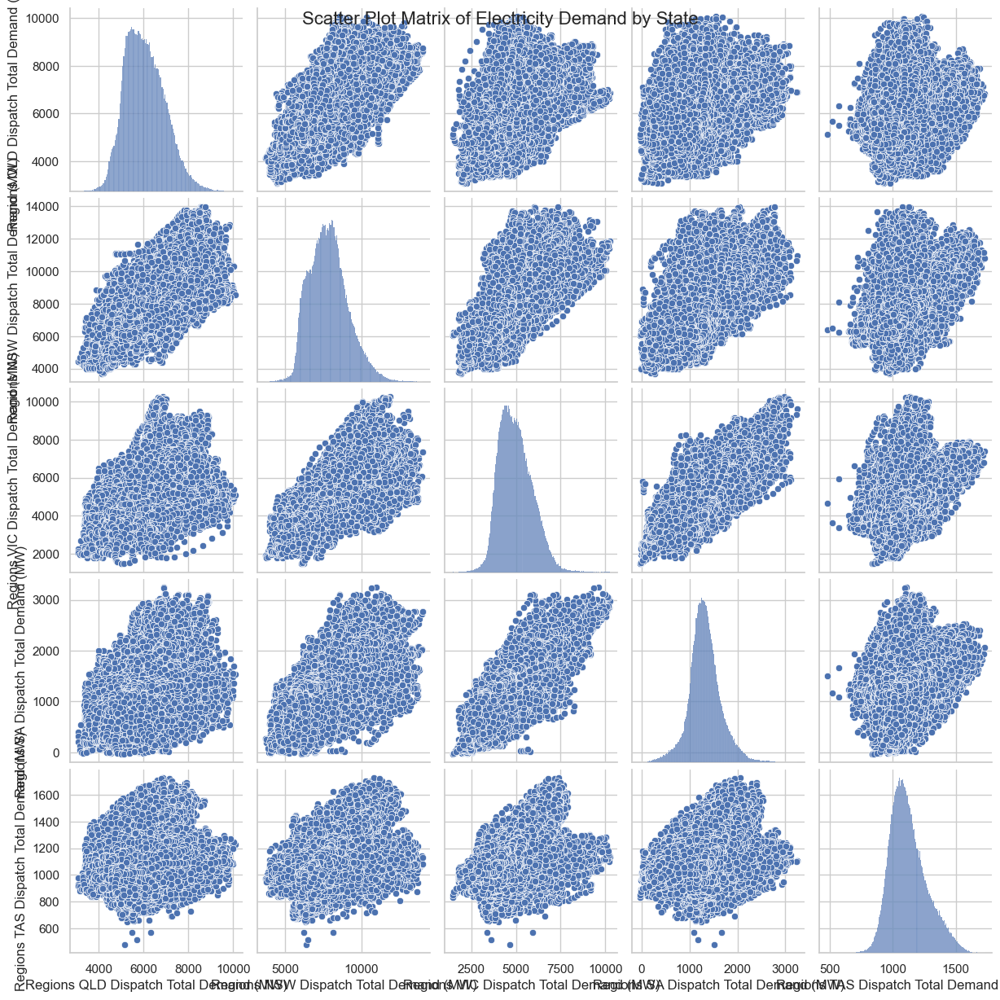

In [171]:
# Extract columns related to total demand for each region
demand_columns = [col for col in data.columns if "Total Demand" in col]
demand_data = data[demand_columns]

# Creating scatter plot matrix
sns.pairplot(demand_data)
plt.suptitle('Scatter Plot Matrix of Electricity Demand by State', size=16)
plt.show()

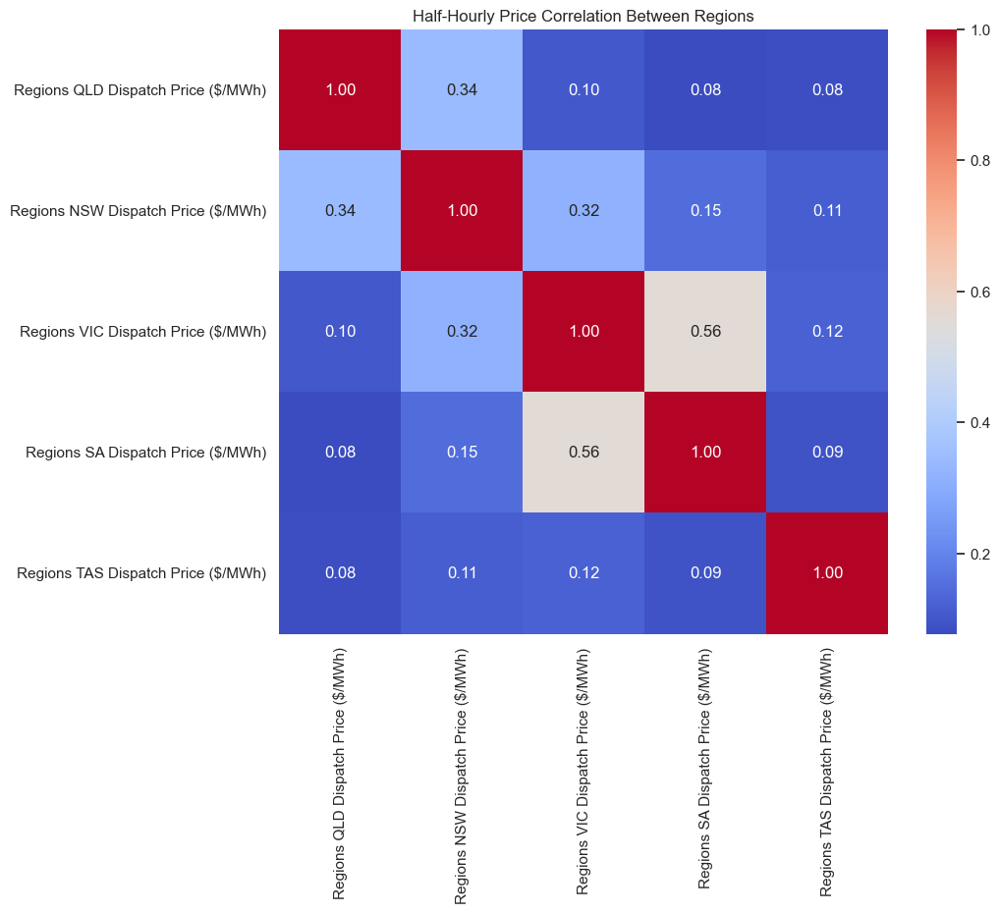

In [172]:
# Extract half-hourly price data for each region
price_columns = [col for col in data.columns if 'Dispatch Price' in col]
price_data = data[price_columns]

# Calculate the correlation matrix
price_correlation = price_data.corr()

# Visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(price_correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Half-Hourly Price Correlation Between Regions')
plt.show()

/var/folders/6d/402nhvmn6gs6bk9gc89q7gy40000gn/T/ipykernel_1448/2324737213.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  daily_data = data.resample('D', on='Time (UTC+10)').mean()


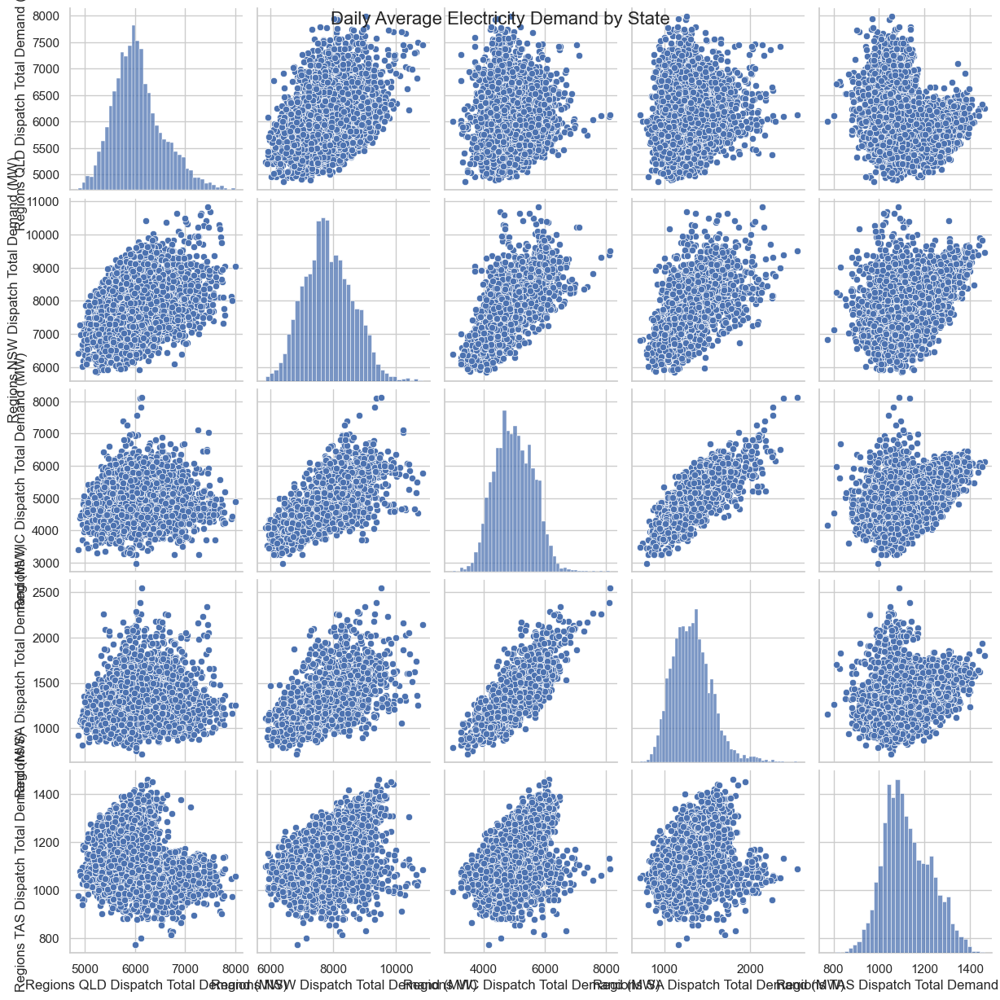

In [173]:
# Resample data to get daily averages
daily_data = data.resample('D', on='Time (UTC+10)').mean()

# Extract columns related to total demand for each region from the resampled daily data
daily_demand_columns = [col for col in daily_data.columns if "Total Demand" in col]
daily_demand_data = daily_data[daily_demand_columns]

# Now, let's plot the scatter plot matrix for the daily average demand
sns.pairplot(daily_demand_data)
plt.suptitle('Daily Average Electricity Demand by State', size=16)
plt.show()

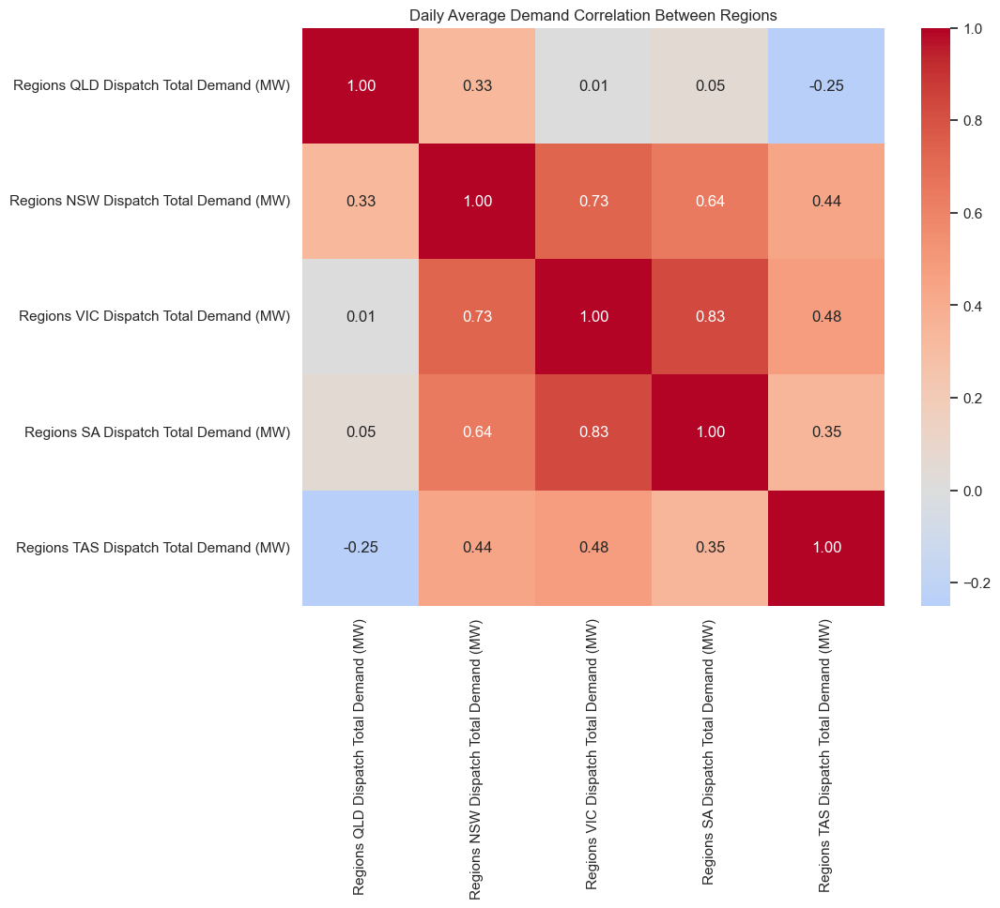

In [174]:
# Calculate the correlation matrix for the daily average demand data and visualize it using a heatmap.
daily_demand_correlation = daily_demand_data.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(daily_demand_correlation, annot=True, cmap='coolwarm', fmt=".2f", center=0)
plt.title('Daily Average Demand Correlation Between Regions')
plt.show()

/var/folders/6d/402nhvmn6gs6bk9gc89q7gy40000gn/T/ipykernel_1448/2573143443.py:19: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  daily_data = data.resample('D', on='Time (UTC+10)').mean()


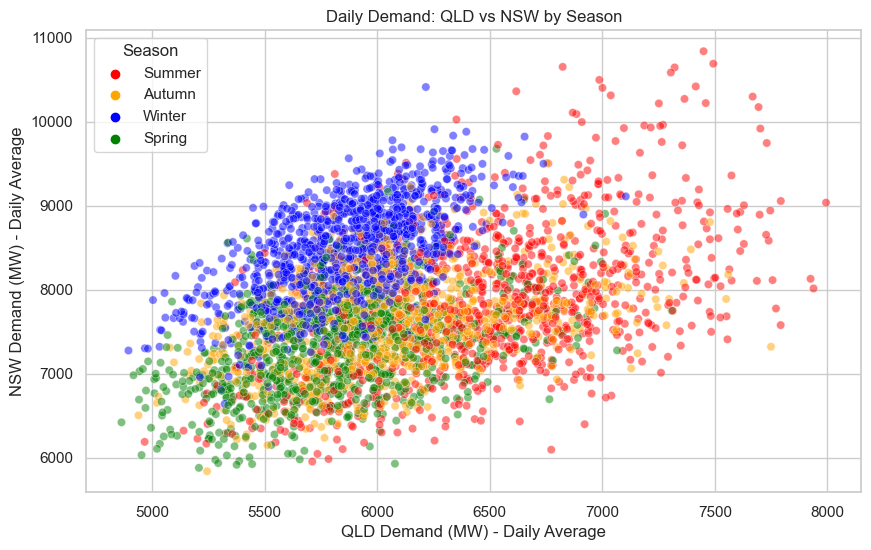

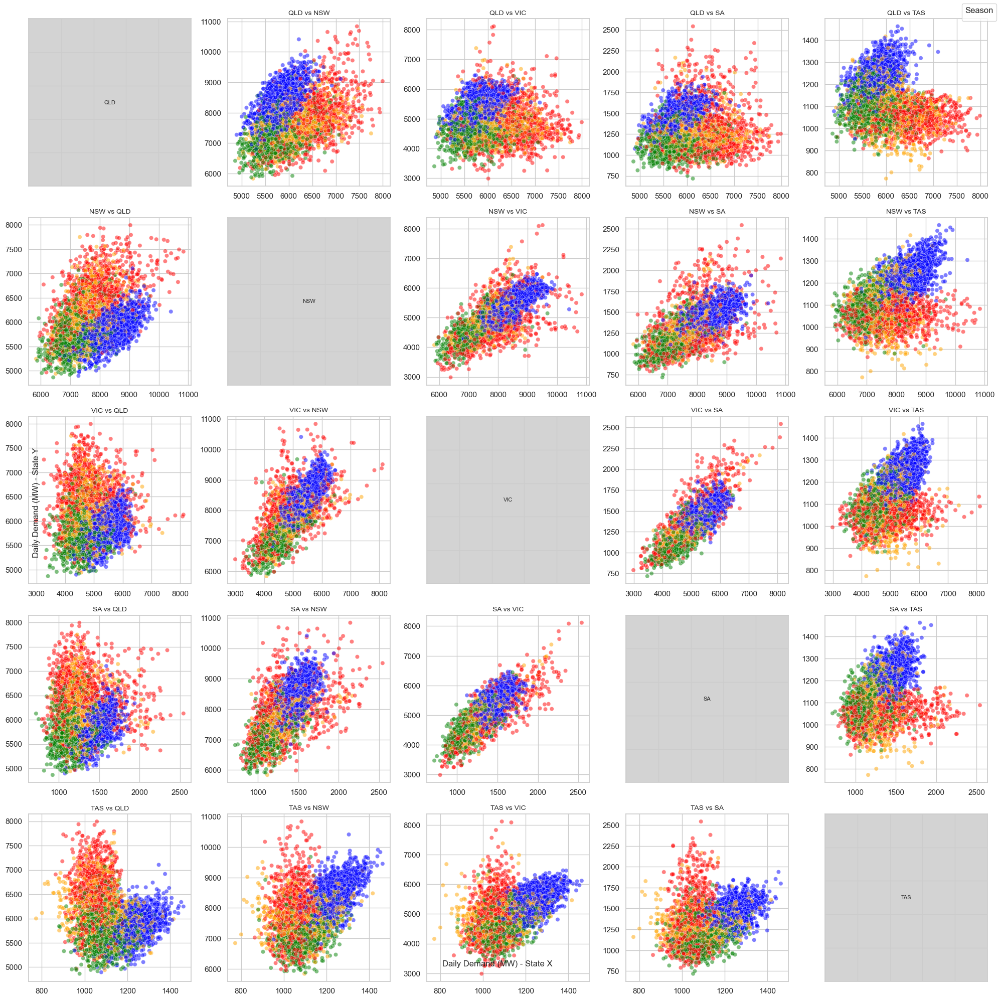

In [175]:
# Convert 'Time (UTC+10)' column to datetime format for easier handling
data['Time (UTC+10)'] = pd.to_datetime(data['Time (UTC+10)'])

# Define Australian seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Summer'
    elif month in [3, 4, 5]:
        return 'Autumn'
    elif month in [6, 7, 8]:
        return 'Winter'
    elif month in [9, 10, 11]:
        return 'Spring'

# Apply the function to assign season based on the month
data['Season'] = data['Time (UTC+10)'].dt.month.apply(get_season)

# Aggregate data to daily averages
daily_data = data.resample('D', on='Time (UTC+10)').mean()

# Add the season column back into the daily_data DataFrame
# This requires a little bit of a trick since resampling removes non-numeric columns.
# We'll merge the daily average data back with the original DataFrame on the date to get the season.
daily_data['Date'] = daily_data.index.date
data['Date'] = data['Time (UTC+10)'].dt.date
daily_data_with_season = pd.merge(daily_data, data[['Date', 'Season']].drop_duplicates(), on='Date', how='left')

# Check the structure of the merged DataFrame to proceed with plotting
daily_data_with_season.head()

# Setting the color palette for the seasons
palette = {'Summer': 'red', 'Autumn': 'orange', 'Winter': 'blue', 'Spring': 'green'}

# Plotting
plt.figure(figsize=(10, 6))
sns.scatterplot(data=daily_data_with_season,
                x='Regions QLD Dispatch Total Demand (MW)',
                y='Regions NSW Dispatch Total Demand (MW)',
                hue='Season',
                palette=palette,
                alpha=0.5)

plt.title('Daily Demand: QLD vs NSW by Season')
plt.xlabel('QLD Demand (MW) - Daily Average')
plt.ylabel('NSW Demand (MW) - Daily Average')
plt.legend(title='Season')
plt.grid(True)
plt.show()


# Extracting state names from column names
state_names = ['QLD', 'NSW', 'VIC', 'SA', 'TAS']

# Creating a figure for the scatter plots
fig, axs = plt.subplots(len(state_names), len(state_names), figsize=(20, 20))

for i, state_x in enumerate(state_names):
    for j, state_y in enumerate(state_names):
        if i == j:
            # Diagonal - We won't plot state vs. itself, so let's just fill it with a solid color for clarity
            axs[i, j].set_facecolor('lightgrey')
            axs[i, j].text(0.5, 0.5, state_x, fontsize=8, ha='center', va='center')
            axs[i, j].set_xticklabels([])
            axs[i, j].set_yticklabels([])
        else:
            # Off-diagonal - Scatter plot between different states
            demand_x = f'Regions {state_x} Dispatch Total Demand (MW)'
            demand_y = f'Regions {state_y} Dispatch Total Demand (MW)'
            
            sns.scatterplot(ax=axs[i, j],
                            data=daily_data_with_season,
                            x=demand_x,
                            y=demand_y,
                            hue='Season',
                            palette=palette,
                            legend=False,
                            alpha=0.5)
            
            # Simplify the plots
            axs[i, j].set_xlabel('')
            axs[i, j].set_ylabel('')
            axs[i, j].set_title(f'{state_x} vs {state_y}', fontsize=10)

# Adjust layout
plt.tight_layout()

# Add a common X and Y label
fig.text(0.5, 0.04, 'Daily Demand (MW) - State X', ha='center', va='center')
fig.text(0.04, 0.5, 'Daily Demand (MW) - State Y', ha='center', va='center', rotation='vertical')

# Adding a common legend for the seasons
handles, labels = axs[0, 1].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', title='Season')

plt.show()

In [176]:
seasons = {'Summer': (12, 1, 2), 'Autumn': (3, 4, 5), 'Winter': (6, 7, 8), 'Spring': (9, 10, 11)}
state_names = ['QLD', 'NSW', 'VIC', 'SA', 'TAS']

for season, months in seasons.items():
    # Filter data for the current season
    season_data = daily_data_with_season[daily_data_with_season['Season'] == season]
    
    # Selecting demand columns for states and calculating correlations
    demand_columns = [f'Regions {state} Dispatch Total Demand (MW)' for state in state_names]
    correlation_matrix = season_data[demand_columns].corr()
    
    print(f"Correlation Matrix for {season}:")
    print(correlation_matrix)
    print("\n")

Correlation Matrix for Summer:
                                        Regions QLD Dispatch Total Demand (MW)  \
Regions QLD Dispatch Total Demand (MW)                                1.000000   
Regions NSW Dispatch Total Demand (MW)                                0.472224   
Regions VIC Dispatch Total Demand (MW)                               -0.027407   
Regions SA Dispatch Total Demand (MW)                                -0.106842   
Regions TAS Dispatch Total Demand (MW)                                0.040762   

                                        Regions NSW Dispatch Total Demand (MW)  \
Regions QLD Dispatch Total Demand (MW)                                0.472224   
Regions NSW Dispatch Total Demand (MW)                                1.000000   
Regions VIC Dispatch Total Demand (MW)                                0.565256   
Regions SA Dispatch Total Demand (MW)                                 0.439347   
Regions TAS Dispatch Total Demand (MW)                            

In [177]:
seasons = ['Summer', 'Autumn', 'Winter', 'Spring']
state_names = ['QLD', 'NSW', 'VIC', 'SA', 'TAS']

# For each season, calculate the average and standard deviation of demand and price
for season in seasons:
    season_data = daily_data_with_season[daily_data_with_season['Season'] == season]
    
    for state in state_names:
        demand_col = f'Regions {state} Dispatch Total Demand (MW)'
        price_col = f'Regions {state} Dispatch Price ($/MWh)'
        
        # Calculate mean and standard deviation
        avg_demand = season_data[demand_col].mean()
        std_demand = season_data[demand_col].std()
        avg_price = season_data[price_col].mean()
        std_price = season_data[price_col].std()
        
        print(f"{state} - {season}:")
        print(f"  Average Demand (MW): {avg_demand:.2f}, Volatility: {std_demand:.2f}")
        print(f"  Average Price ($/MWh): {avg_price:.2f}, Price Volatility: {std_price:.2f}\n")

QLD - Summer:
  Average Demand (MW): 6495.60, Volatility: 535.79
  Average Price ($/MWh): 90.37, Price Volatility: 122.66

NSW - Summer:
  Average Demand (MW): 7883.22, Volatility: 853.05
  Average Price ($/MWh): 69.38, Price Volatility: 83.24

VIC - Summer:
  Average Demand (MW): 4861.40, Volatility: 745.57
  Average Price ($/MWh): 62.78, Price Volatility: 140.25

SA - Summer:
  Average Demand (MW): 1337.09, Volatility: 302.61
  Average Price ($/MWh): 75.89, Price Volatility: 148.60

TAS - Summer:
  Average Demand (MW): 1048.21, Volatility: 53.44
  Average Price ($/MWh): 69.82, Price Volatility: 40.09

QLD - Autumn:
  Average Demand (MW): 6064.34, Volatility: 446.19
  Average Price ($/MWh): 86.71, Price Volatility: 111.16

NSW - Autumn:
  Average Demand (MW): 7636.05, Volatility: 563.93
  Average Price ($/MWh): 82.25, Price Volatility: 68.15

VIC - Autumn:
  Average Demand (MW): 4924.68, Volatility: 532.67
  Average Price ($/MWh): 71.41, Price Volatility: 58.94

SA - Autumn:
  Average

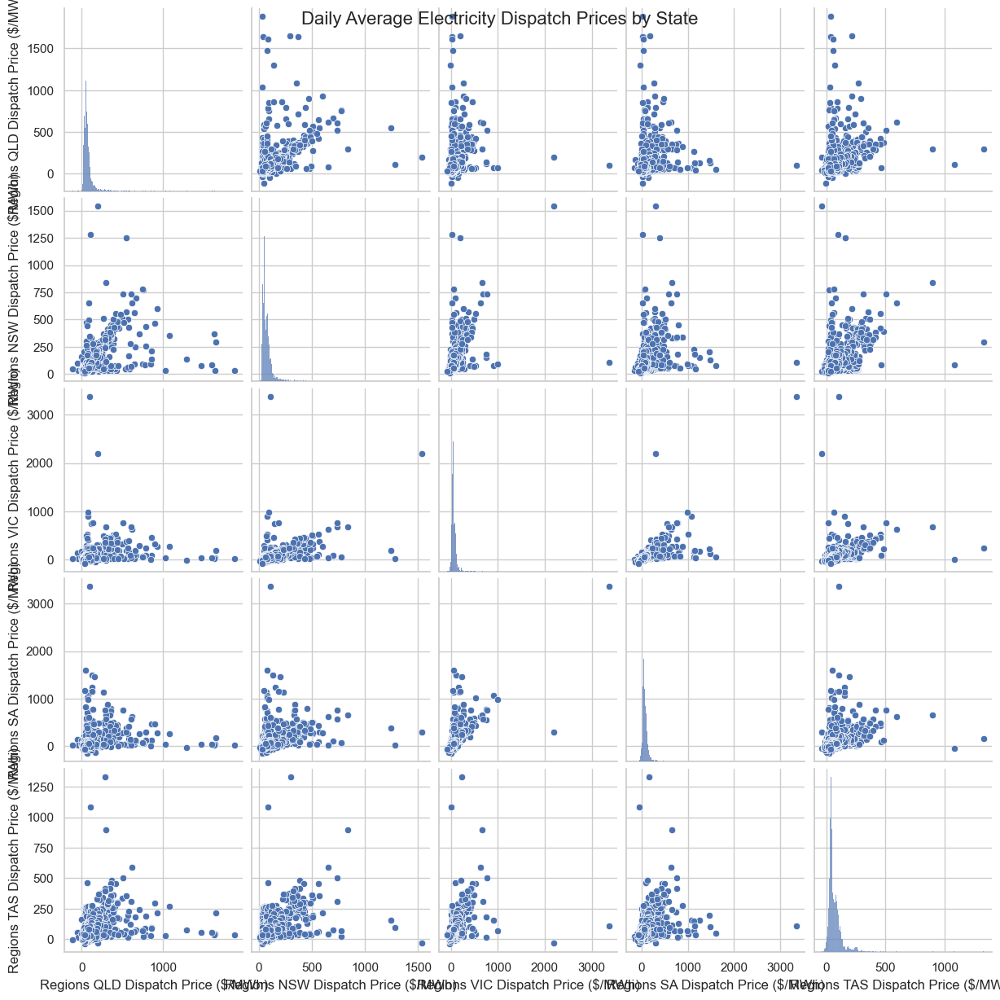

In [178]:
# First, let's resample the original dataset to get daily averages for price data as well.
daily_price_data = daily_data[[col for col in daily_data.columns if "Dispatch Price" in col]]

# Now, creating scatter plot matrix for the daily average prices
sns.pairplot(daily_price_data)
plt.suptitle('Daily Average Electricity Dispatch Prices by State', size=16)
plt.show()

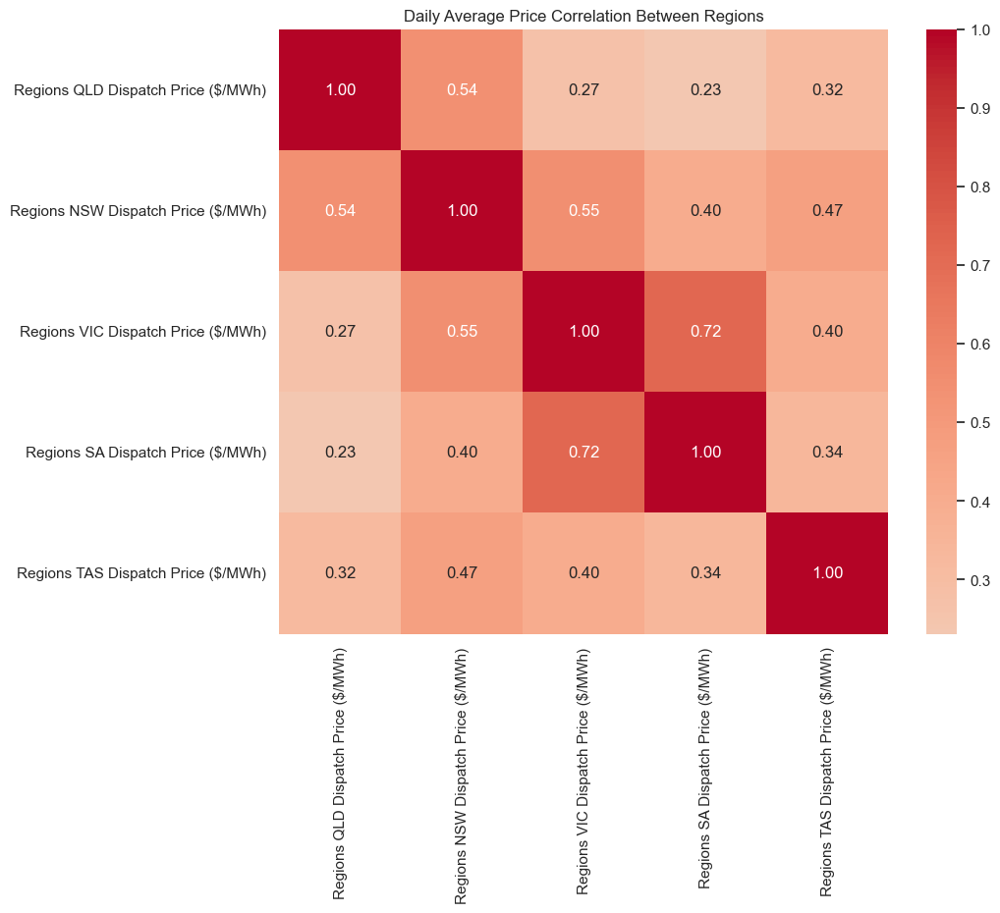

In [179]:
# Calculate the correlation matrix for the daily average price data
daily_price_correlation = daily_price_data.corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(daily_price_correlation, annot=True, cmap='coolwarm', fmt=".2f", center=0)
plt.title('Daily Average Price Correlation Between Regions')
plt.show()

## Look at Solar Generation

In an effort to analyze the trends in solar energy generation across different regions, I began by identifying columns in our dataset that pertained to solar generation. Specifically, I looked for columns with "Solar" in their names and "MW" to indicate their relevance to solar power output measurements.

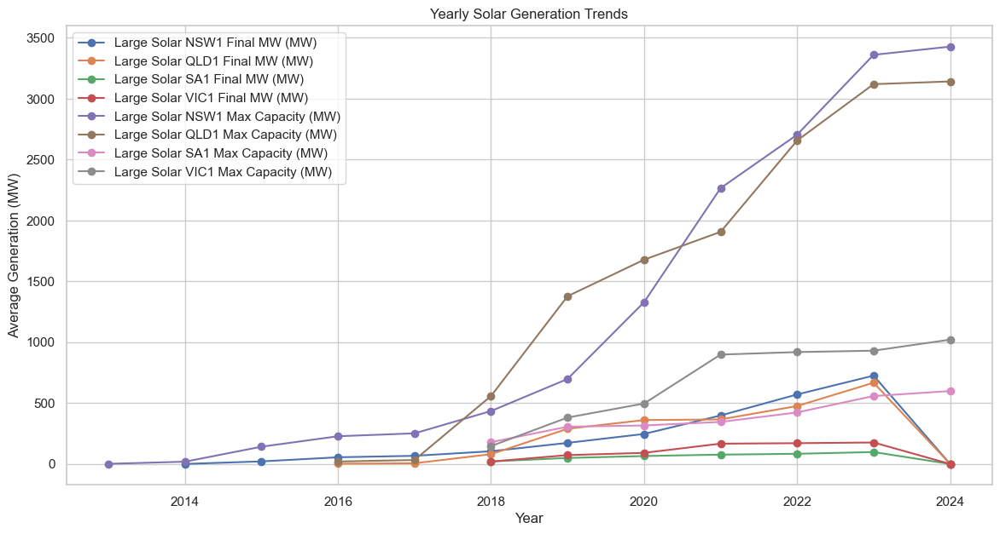

In [180]:
# Assuming solar generation columns are identified with "Solar" in their names
solar_columns = [col for col in data.columns if 'Solar' in col and 'MW' in col]

# Check if we have identified solar generation columns
if solar_columns:
    # Aggregate solar generation data for daily averages
    data['Date'] = data['Time (UTC+10)'].dt.date
    daily_solar_data = data.groupby('Date')[solar_columns].mean()

    # Further aggregate to yearly averages for visualization
    data['Year'] = data['Time (UTC+10)'].dt.year
    yearly_solar_data = data.groupby('Year')[solar_columns].mean()

    # Plotting the yearly trends in solar generation
    plt.figure(figsize=(14, 7))
    for col in solar_columns:
        plt.plot(yearly_solar_data.index, yearly_solar_data[col], label=col, marker='o')
    plt.title('Yearly Solar Generation Trends')
    plt.xlabel('Year')
    plt.ylabel('Average Generation (MW)')
    plt.legend()
    plt.grid(True)
    plt.show()

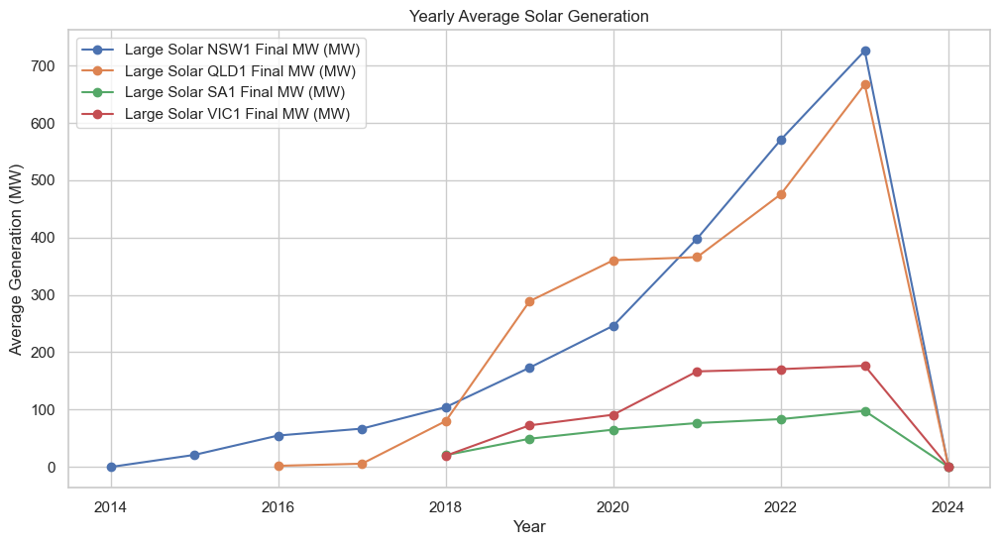

In [181]:
# Aggregate Solar Generation Data
data_reloaded = data

# Convert 'Time (UTC+10)' to datetime and extract year for aggregation
data_reloaded['Time (UTC+10)'] = pd.to_datetime(data_reloaded['Time (UTC+10)'])
data_reloaded['Year'] = data_reloaded['Time (UTC+10)'].dt.year

# Identify solar generation columns - we're interested in "Final MW" columns for actual generation
solar_gen_columns = [col for col in data_reloaded.columns if 'Solar' in col and 'Final MW' in col]

# Since solar generation columns might have NaN values, aggregate data by year and calculate the mean
yearly_solar_gen = data_reloaded.groupby('Year')[solar_gen_columns].mean()

# Visualize Solar Generation Trends
# Plotting yearly averages of solar generation
plt.figure(figsize=(12, 6))
for col in solar_gen_columns:
    plt.plot(yearly_solar_gen.index, yearly_solar_gen[col], marker='o', label=col)
plt.title('Yearly Average Solar Generation')
plt.xlabel('Year')
plt.ylabel('Average Generation (MW)')
plt.legend()
plt.grid(True)
plt.show()

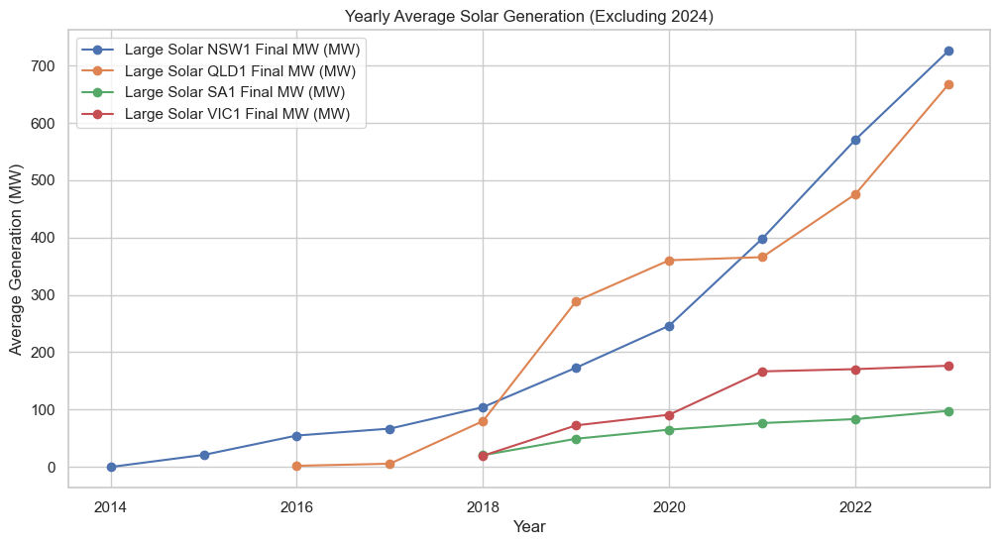

In [182]:
# Exclude 2024 data due to incomplete year
yearly_solar_gen_excl_2024 = yearly_solar_gen[yearly_solar_gen.index < 2024]

# Re-plotting yearly averages of solar generation excluding 2024
plt.figure(figsize=(12, 6))
for col in solar_gen_columns:
    plt.plot(yearly_solar_gen_excl_2024.index, yearly_solar_gen_excl_2024[col], marker='o', label=col)
plt.title('Yearly Average Solar Generation (Excluding 2024)')
plt.xlabel('Year')
plt.ylabel('Average Generation (MW)')
plt.legend()
plt.grid(True)
plt.show()

To assess and project the growth of solar generation capacity, I aggregated solar generation data across all relevant columns to obtain a comprehensive figure for each year. This approach assumes the total across these columns accurately reflects the overall solar generation capacity annually. Following this aggregation, I calculated the total solar generation for each year, consolidating the data into a single metric that represents the cumulative solar generation capacity.

/var/folders/6d/402nhvmn6gs6bk9gc89q7gy40000gn/T/ipykernel_1448/898706724.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  yearly_solar_gen_excl_2024['Total Solar Generation (MW)'] = yearly_solar_gen_excl_2024.sum(axis=1)


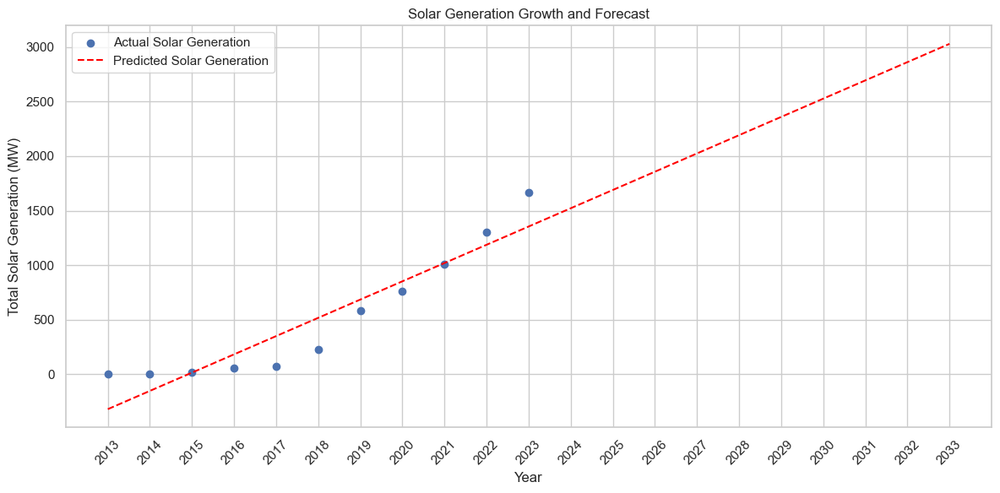

In [183]:
# Summing up all solar generation columns for each year to get a total solar generation figure
yearly_solar_gen_excl_2024['Total Solar Generation (MW)'] = yearly_solar_gen_excl_2024.sum(axis=1)

# Preparing data for modeling
X_solar = yearly_solar_gen_excl_2024.index.values.reshape(-1, 1)  # Years
y_solar = yearly_solar_gen_excl_2024['Total Solar Generation (MW)'].values  # Total Solar Generation

# Fitting a linear regression model to the data
solar_model = LinearRegression().fit(X_solar, y_solar)

# Predicting solar generation for a range of years, extending beyond the current data to forecast future growth
future_years = np.arange(X_solar.min(), X_solar.max() + 11).reshape(-1, 1)  # Extending 10 years into the future
solar_predictions = solar_model.predict(future_years)

# Convert future years to integers for plotting
future_years_int = future_years.astype(int)

# Re-plotting with integer years
plt.figure(figsize=(12, 6))
plt.scatter(X_solar, y_solar, label='Actual Solar Generation')
plt.plot(future_years_int, solar_predictions, label='Predicted Solar Generation', linestyle='--', color='red')
plt.title('Solar Generation Growth and Forecast')
plt.xlabel('Year')
plt.xticks(future_years_int.flatten(), future_years_int.flatten(), rotation=45)  # Set x-axis ticks to be integer years
plt.ylabel('Total Solar Generation (MW)')
plt.legend()
plt.grid(True)
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()

This solar generation growth prediction can be improved in the future

# Continuing with data exploration

Futher data exploration is conducted to understand how the typical daily demand curve / price curve has varied over the years.

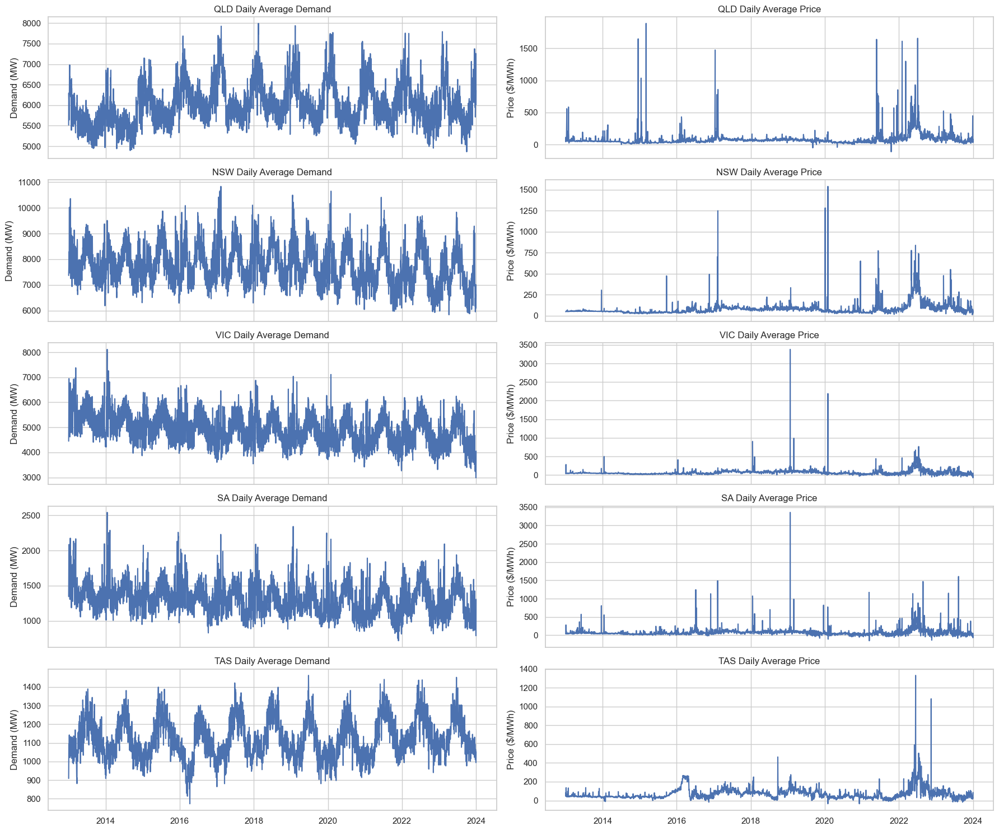

In [184]:
# Aggregate Daily Data
data_reloaded['Date'] = data_reloaded['Time (UTC+10)'].dt.date

# Identify regions from the dataset based on the column names
regions = [col.split(' ')[1] for col in data_reloaded.columns if 'Dispatch Price' in col]

# Initialize a DataFrame to hold daily averages for each region
daily_averages = pd.DataFrame()

for region in regions:
    # Aggregating daily demand and price for each region
    demand_col = f'Regions {region} Dispatch Total Demand (MW)'
    price_col = f'Regions {region} Dispatch Price ($/MWh)'
    
    daily_avg = data_reloaded.groupby('Date')[[demand_col, price_col]].mean()
    daily_avg.columns = [f'{region} Demand (MW)', f'{region} Price ($/MWh)']
    
    if daily_averages.empty:
        daily_averages = daily_avg
    else:
        daily_averages = daily_averages.join(daily_avg, how='outer')

# Visualize Trends Over Time for each region's demand and price
fig, axs = plt.subplots(len(regions), 2, figsize=(18, 3 * len(regions)), sharex=True)

for i, region in enumerate(regions):
    # Plotting daily average demand
    axs[i, 0].plot(daily_averages.index, daily_averages[f'{region} Demand (MW)'])
    axs[i, 0].set_title(f'{region} Daily Average Demand')
    axs[i, 0].set_ylabel('Demand (MW)')
    
    # Plotting daily average price
    axs[i, 1].plot(daily_averages.index, daily_averages[f'{region} Price ($/MWh)'])
    axs[i, 1].set_title(f'{region} Daily Average Price')
    axs[i, 1].set_ylabel('Price ($/MWh)')

plt.tight_layout()
plt.show()

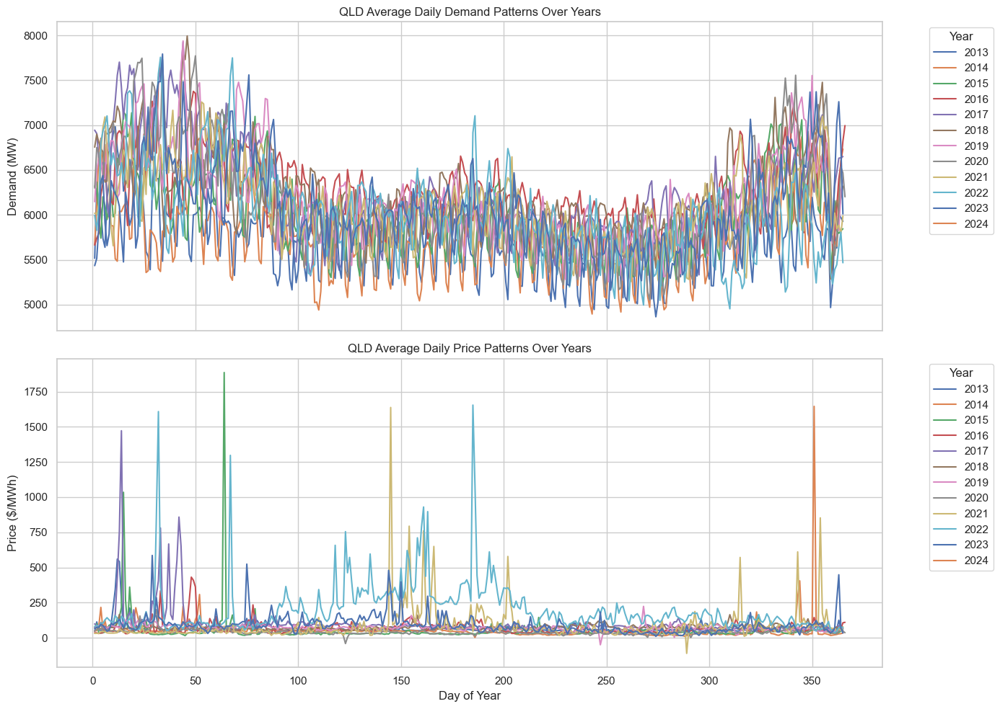

In [185]:
# Aggregate Data by Year and Day of Year
data_reloaded['DayOfYear'] = data_reloaded['Time (UTC+10)'].dt.dayofyear

# Creating a DataFrame to hold yearly average day patterns for demand and price for QLD
yearly_patterns = pd.DataFrame()

for region in regions:
    demand_col = f'Regions {region} Dispatch Total Demand (MW)'
    price_col = f'Regions {region} Dispatch Price ($/MWh)'
    
    # Aggregating data by year and day of year for each region
    region_patterns = data_reloaded.groupby(['Year', 'DayOfYear'])[[demand_col, price_col]].mean().reset_index()
    region_patterns['Region'] = region
    
    yearly_patterns = pd.concat([yearly_patterns, region_patterns], axis=0)

# Visualize the Yearly Average Day for QLD
example_region = regions[0] 
region_data = yearly_patterns[yearly_patterns['Region'] == example_region]

# Plotting average day patterns across different years for the selected region
fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Filter years for the example to limit the number of lines in the plot
example_years = sorted(region_data['Year'].unique())

for year in example_years:
    subset = region_data[region_data['Year'] == year]
    axs[0].plot(subset['DayOfYear'], subset[f'Regions {example_region} Dispatch Total Demand (MW)'], label=year)
    axs[1].plot(subset['DayOfYear'], subset[f'Regions {example_region} Dispatch Price ($/MWh)'], label=year)

axs[0].set_title(f'{example_region} Average Daily Demand Patterns Over Years')
axs[0].set_ylabel('Demand (MW)')
axs[0].legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')

axs[1].set_title(f'{example_region} Average Daily Price Patterns Over Years')
axs[1].set_xlabel('Day of Year')
axs[1].set_ylabel('Price ($/MWh)')
axs[1].legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# How have the daily demand profile changed over time?

To understand the temporal variations in electricity demand within the Queensland region and how these patterns have evolved over time, I embarked on a detailed analysis focusing on the hourly demand throughout different years. This analysis aimed to reveal any significant changes in consumption patterns, potentially attributable to socio-economic factors, changes in population, or advancements in energy efficiency and renewable energy sources.

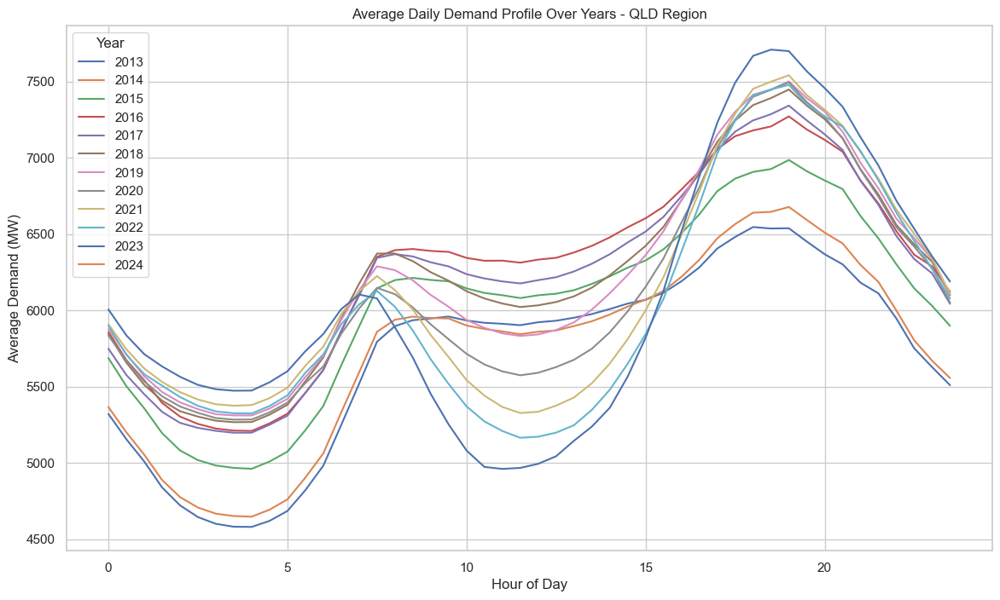

In [186]:
# Calculate the hour of the day for aggregation
data_reloaded['HourOfDay'] = data_reloaded['Time (UTC+10)'].dt.hour + data_reloaded['Time (UTC+10)'].dt.minute / 60

# Initialize a dictionary to store average daily demand profiles for each year
average_daily_profiles = {}

# Example region for demonstration
example_region = 'QLD'  # Modify this as needed for other regions

for year in sorted(data_reloaded['Year'].unique()):
    # Filter data for the current year and region
    year_data = data_reloaded[data_reloaded['Year'] == year]
    
    # Calculate the average demand for each hour of the day across all days in the year
    average_profile = year_data.groupby('HourOfDay')[f'Regions {example_region} Dispatch Total Demand (MW)'].mean()
    
    # Store the average profile in the dictionary
    average_daily_profiles[year] = average_profile

# Plotting the average daily demand profiles for each year
plt.figure(figsize=(14, 8))
for year, profile in average_daily_profiles.items():
    plt.plot(profile.index, profile, label=year)

plt.title(f'Average Daily Demand Profile Over Years - {example_region} Region')
plt.xlabel('Hour of Day')
plt.ylabel('Average Demand (MW)')
plt.legend(title='Year')
plt.grid(True)
plt.show()

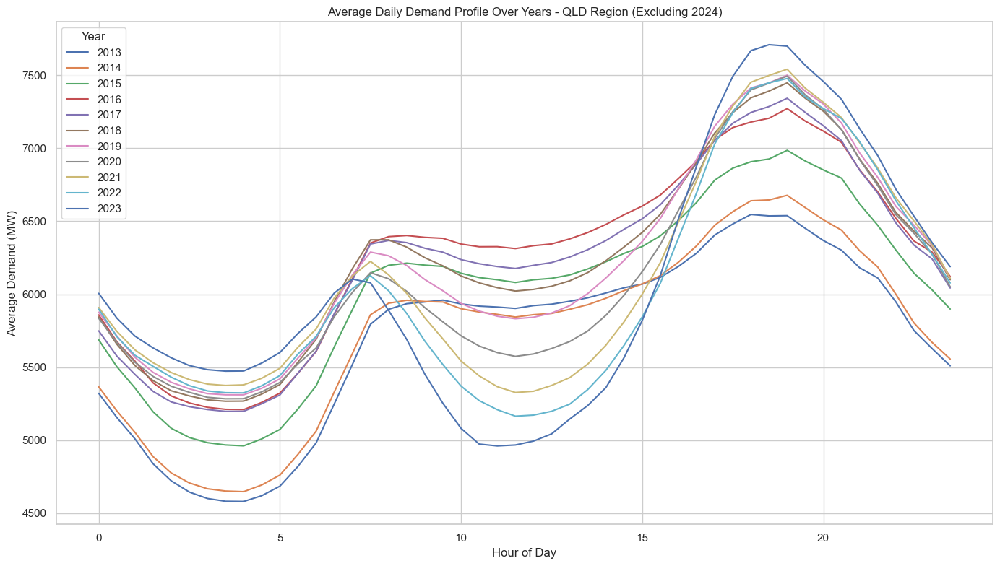

In [187]:
# Exclude the year 2024 from the analysis due to incomplete data
average_daily_profiles_excl_2024 = {year: profile for year, profile in average_daily_profiles.items() if year < 2024}

# Re-plotting the average daily demand profiles excluding 2024
plt.figure(figsize=(14, 8))
for year, profile in average_daily_profiles_excl_2024.items():
    plt.plot(profile.index, profile, label=year)

plt.title(f'Average Daily Demand Profile Over Years - {example_region} Region (Excluding 2024)')
plt.xlabel('Hour of Day')
plt.ylabel('Average Demand (MW)')
plt.legend(title='Year', loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

To achieve a multidimensional perspective, I leveraged a 3D surface plot, which vividly illustrated the year-to-year comparison of average daily demand profiles in the QLD region. This visualization not only highlighted the dynamic nature of electricity demand over time but also served as a crucial tool in identifying patterns, peaks, and troughs in demand. Through this methodical approach, I was able to derive meaningful insights into demand variability, significantly contributing to our understanding of regional energy consumption trends.

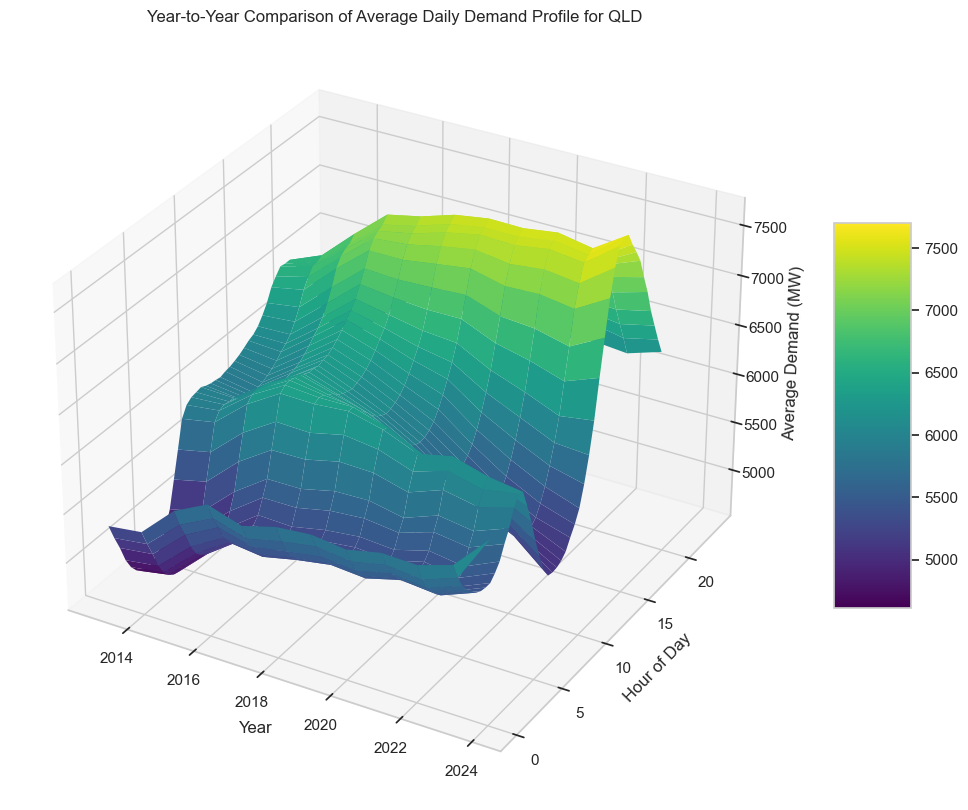

In [188]:
# Load the provided CSV file
data_loaded = data

# Convert 'Time (UTC+10)' to datetime format
data_loaded['Time (UTC+10)'] = pd.to_datetime(data_loaded['Time (UTC+10)'], format='%d-%b-%Y %H:%M')

# Calculate the hour of the day with minute precision
data_loaded['HourOfDay'] = data_loaded['Time (UTC+10)'].dt.hour + data_loaded['Time (UTC+10)'].dt.minute / 60

# Extract year for aggregation
data_loaded['Year'] = data_loaded['Time (UTC+10)'].dt.year

# Filter data for the QLD region and aggregate to find the average demand for each hour of each day of the year
avg_daily_demand_qld = data_loaded.groupby(['Year', 'HourOfDay'])['Regions QLD Dispatch Total Demand (MW)'].mean().unstack(level=0)

# Preparing data for the 3D surface plot
X_qld, Y_qld = np.meshgrid(avg_daily_demand_qld.columns, avg_daily_demand_qld.index)
Z_qld = avg_daily_demand_qld.values

# Plotting the year-to-year comparison using a surface plot for QLD region
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
surf_qld = ax.plot_surface(X_qld, Y_qld, Z_qld, cmap='viridis', edgecolor='none')
ax.set_xlabel('Year')
ax.set_ylabel('Hour of Day')
ax.set_zlabel('Average Demand (MW)')
ax.set_title('Year-to-Year Comparison of Average Daily Demand Profile for QLD')
fig.colorbar(surf_qld, shrink=0.5, aspect=5) # Add a color bar which maps values to colors.
plt.show()

By systematically analyzing the seasonal variations in electricity demand, I uncovered insightful patterns that reflect the impact of climatic changes on energy consumption. The detailed, season-specific demand profiles significantly contributed to my understanding of the region's energy consumption trends, offering valuable perspectives for energy management and forecasting.

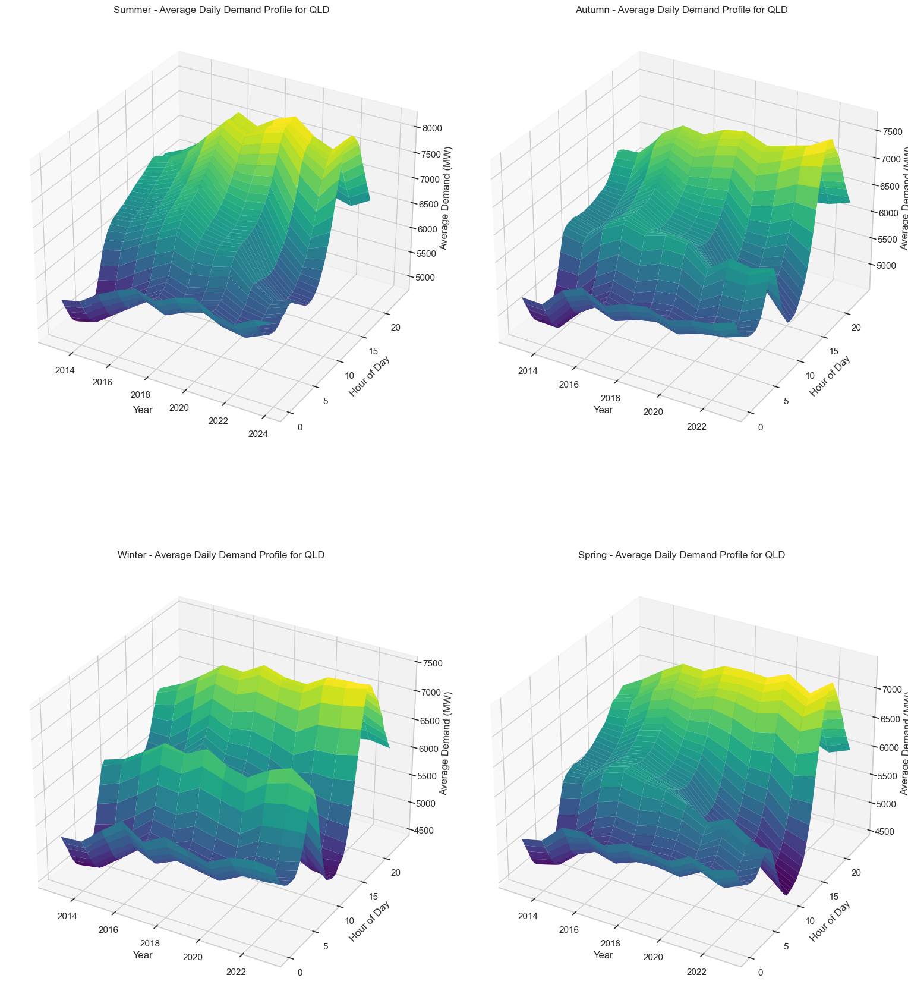

In [189]:
# Define Australian seasons by month ranges
seasons = {
    'Summer': (12, 1, 2),  # December, January, February
    'Autumn': (3, 4, 5),   # March, April, May
    'Winter': (6, 7, 8),   # June, July, August
    'Spring': (9, 10, 11)  # September, October, November
}

# Initialize a figure for plotting
fig = plt.figure(figsize=(16, 20))

# Iterate over seasons to filter data and plot
for i, (season, months) in enumerate(seasons.items(), start=1):
    # Filter data for the current season
    season_data = data_loaded[data_loaded['Time (UTC+10)'].dt.month.isin(months)]
    
    # Aggregate to find the average demand for each hour of each day of the year
    avg_daily_demand_season = season_data.groupby(['Year', 'HourOfDay'])['Regions QLD Dispatch Total Demand (MW)'].mean().unstack(level=0)
    
    # Preparing data for the 3D surface plot
    X_season, Y_season = np.meshgrid(avg_daily_demand_season.columns, avg_daily_demand_season.index)
    Z_season = avg_daily_demand_season.values

    # Subplot for each season
    ax = fig.add_subplot(2, 2, i, projection='3d')
    surf_season = ax.plot_surface(X_season, Y_season, Z_season, cmap='viridis', edgecolor='none')
    ax.set_xlabel('Year')
    ax.set_ylabel('Hour of Day')
    ax.set_zlabel('Average Demand (MW)')
    ax.set_title(f'{season} - Average Daily Demand Profile for QLD')

# Adjust layout and show the plots
plt.tight_layout(pad=3.0)
plt.show()

Now repeat this for the daily prices.

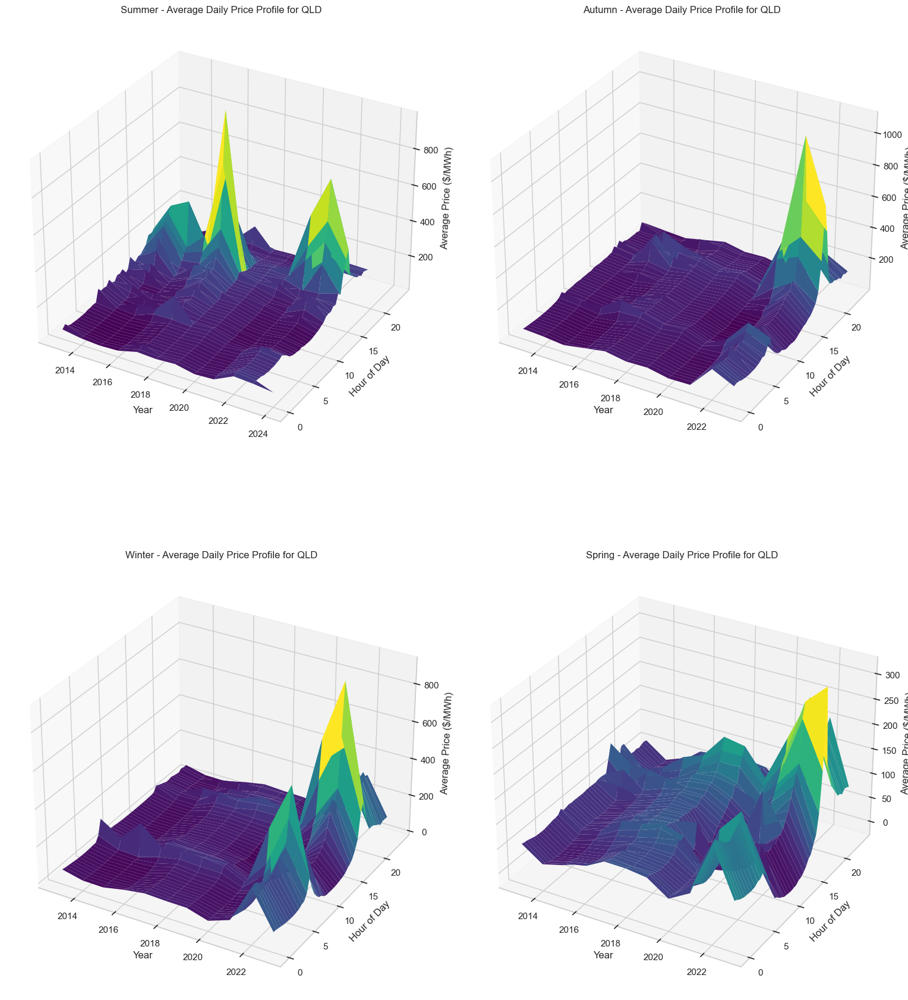

In [190]:
# Initialize a figure for plotting prices
fig = plt.figure(figsize=(16, 20))

# Iterate over seasons to filter data and plot prices
for i, (season, months) in enumerate(seasons.items(), start=1):
    # Filter data for the current season
    season_data_price = data_loaded[data_loaded['Time (UTC+10)'].dt.month.isin(months)]
    
    # Aggregate to find the average price for each hour of each day of the year
    avg_daily_price_season = season_data_price.groupby(['Year', 'HourOfDay'])['Regions QLD Dispatch Price ($/MWh)'].mean().unstack(level=0)
    
    # Preparing data for the 3D surface plot
    X_price_season, Y_price_season = np.meshgrid(avg_daily_price_season.columns, avg_daily_price_season.index)
    Z_price_season = avg_daily_price_season.values

    # Subplot for each season
    ax = fig.add_subplot(2, 2, i, projection='3d')
    surf_price_season = ax.plot_surface(X_price_season, Y_price_season, Z_price_season, cmap='viridis', edgecolor='none')
    ax.set_xlabel('Year')
    ax.set_ylabel('Hour of Day')
    ax.set_zlabel('Average Price ($/MWh)')
    ax.set_title(f'{season} - Average Daily Price Profile for QLD')

# Adjust layout and show the plots
plt.tight_layout(pad=3.0)
plt.show()

Now repeat this for solar generation.

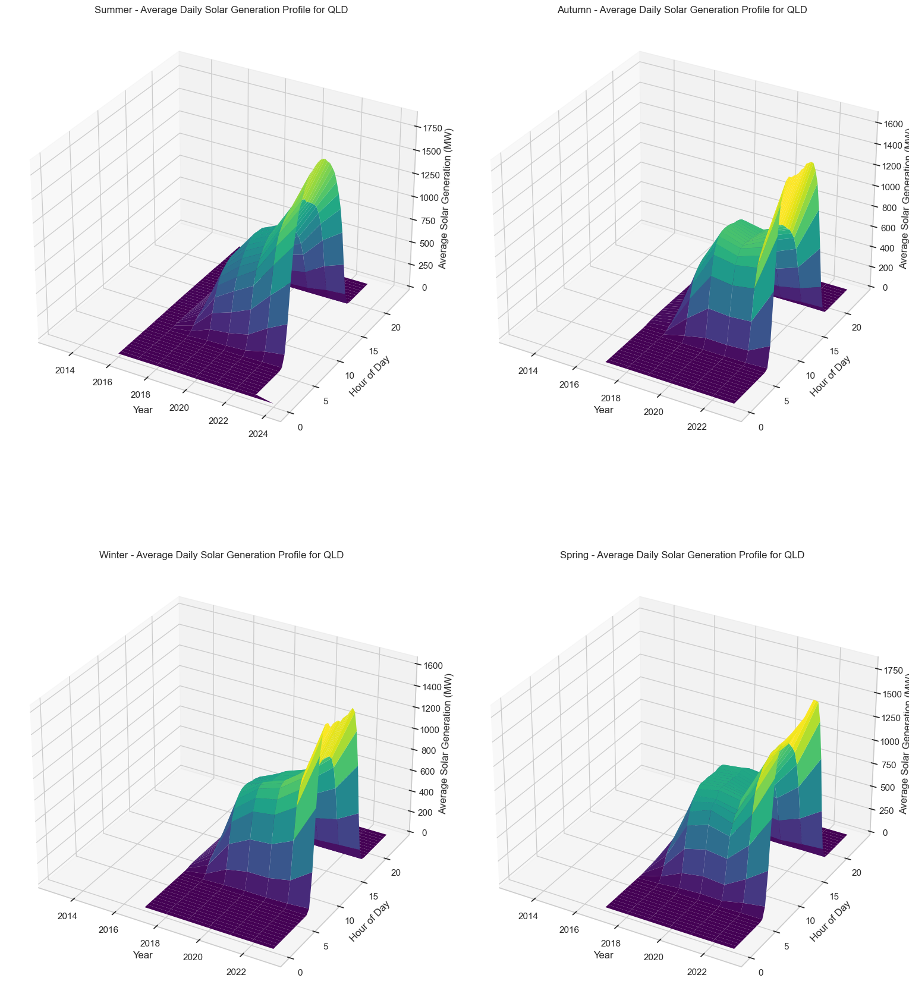

In [191]:
# Identify solar generation columns for QLD - based on the initial data glimpse, focusing on one as an example
solar_column_example = 'Large Solar QLD1 Final MW (MW)'

# Check if the solar generation column exists and is not entirely composed of NaN values
if solar_column_example in data_loaded.columns and not data_loaded[solar_column_example].isna().all():
    # Proceed with the analysis for solar generation
    fig = plt.figure(figsize=(16, 20))

    for i, (season, months) in enumerate(seasons.items(), start=1):
        # Filter data for the current season
        season_data_solar = data_loaded[data_loaded['Time (UTC+10)'].dt.month.isin(months)]
        
        # Aggregate to find the average solar generation for each hour of each day of the year
        avg_daily_solar_season = season_data_solar.groupby(['Year', 'HourOfDay'])[solar_column_example].mean().unstack(level=0)
        
        # Preparing data for the 3D surface plot
        X_solar_season, Y_solar_season = np.meshgrid(avg_daily_solar_season.columns, avg_daily_solar_season.index)
        Z_solar_season = avg_daily_solar_season.values

        # Subplot for each season
        ax = fig.add_subplot(2, 2, i, projection='3d')
        surf_solar_season = ax.plot_surface(X_solar_season, Y_solar_season, Z_solar_season, cmap='viridis', edgecolor='none')
        ax.set_xlabel('Year')
        ax.set_ylabel('Hour of Day')
        ax.set_zlabel('Average Solar Generation (MW)')
        ax.set_title(f'{season} - Average Daily Solar Generation Profile for QLD')

    # Adjust layout and show the plots
    plt.tight_layout(pad=3.0)
    plt.show()

/var/folders/6d/402nhvmn6gs6bk9gc89q7gy40000gn/T/ipykernel_1448/501268711.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  daily_data_january = data_january.resample('D', on='Time (UTC+10)').mean()


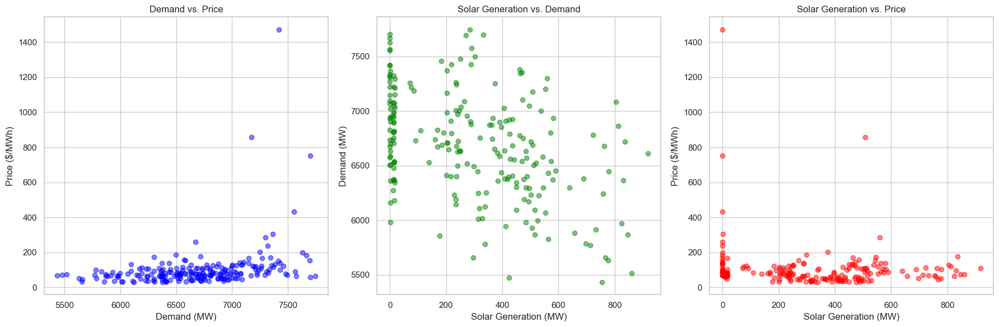

In [192]:
# Filter data for January across all years
data_january = data_loaded[data_loaded['Time (UTC+10)'].dt.month == 1]

# Aggregate data daily for January
daily_data_january = data_january.resample('D', on='Time (UTC+10)').mean()

# Prepare for visualization and analysis
daily_demand_january = daily_data_january['Regions QLD Dispatch Total Demand (MW)']
daily_price_january = daily_data_january['Regions QLD Dispatch Price ($/MWh)']
daily_solar_january = daily_data_january[solar_column_example]

# Drop NaN values for a clean analysis (especially important for solar generation data)
cleaned_daily_data_january = pd.DataFrame({
    'Demand': daily_demand_january,
    'Price': daily_price_january,
    'Solar Generation': daily_solar_january
}).dropna()

# Visualization: Scatter plots to explore relationships
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Demand vs. Price
axs[0].scatter(cleaned_daily_data_january['Demand'], cleaned_daily_data_january['Price'], color='blue', alpha=0.5)
axs[0].set_xlabel('Demand (MW)')
axs[0].set_ylabel('Price ($/MWh)')
axs[0].set_title('Demand vs. Price')

# Demand vs. Solar Generation
axs[1].scatter(cleaned_daily_data_january['Solar Generation'], cleaned_daily_data_january['Demand'], color='green', alpha=0.5)
axs[1].set_xlabel('Solar Generation (MW)')
axs[1].set_ylabel('Demand (MW)')
axs[1].set_title('Solar Generation vs. Demand')

# Price vs. Solar Generation
axs[2].scatter(cleaned_daily_data_january['Solar Generation'], cleaned_daily_data_january['Price'], color='red', alpha=0.5)
axs[2].set_xlabel('Solar Generation (MW)')
axs[2].set_ylabel('Price ($/MWh)')
axs[2].set_title('Solar Generation vs. Price')

plt.tight_layout()
plt.show()

In [193]:
# Calculate Pearson correlation coefficients
correlation_matrix = cleaned_daily_data_january.corr()

# Display the correlation matrix
correlation_matrix

,Demand,Price,Solar Generation
Demand,1.000000,0.308448,-0.437182
Price,0.308448,1.000000,-0.104093
Solar Generation,-0.437182,-0.104093,1.000000


Further analysis will endevour to understand the relationship between demand, solar generation and price. It is suspected that this is now the whole picture and additional variables may be required.

# Price Outliers

I'm analyzing electricity dispatch prices across several Australian regions to identify outliers, understand price distributions, and examine the impact of solar generation on prices. I use statistical methods to detect unusual price movements, visualize these distributions and outliers over time, and specifically investigate how days with low solar generation correlate with high electricity prices. My goal is to uncover insights into the relationship between renewable energy output and market price fluctuations.

In [194]:
# Identifying outliers using the IQR method for each region's dispatch price
outliers_summary = {}

price_columns = [
    'Regions QLD Dispatch Price ($/MWh)',
    'Regions NSW Dispatch Price ($/MWh)',
    'Regions VIC Dispatch Price ($/MWh)',
    'Regions SA Dispatch Price ($/MWh)',
    'Regions TAS Dispatch Price ($/MWh)'
]

for column in price_columns:
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Count outliers
    outliers_count = data[(data[column] < lower_bound) | (data[column] > upper_bound)].shape[0]
    
    outliers_summary[column] = {'Lower Bound': lower_bound, 'Upper Bound': upper_bound, 'Outliers Count': outliers_count}

pd.DataFrame(outliers_summary).T

,Lower Bound,Upper Bound,Outliers Count
Regions QLD Dispatch Price ($/MWh),-29.343862,149.593765,17929.0
Regions NSW Dispatch Price ($/MWh),-26.680930,153.685970,14777.0
Regions VIC Dispatch Price ($/MWh),-49.277318,167.507475,12603.0
Regions SA Dispatch Price ($/MWh),-49.888459,176.809496,18375.0
Regions TAS Dispatch Price ($/MWh),-46.747682,169.667126,11168.0


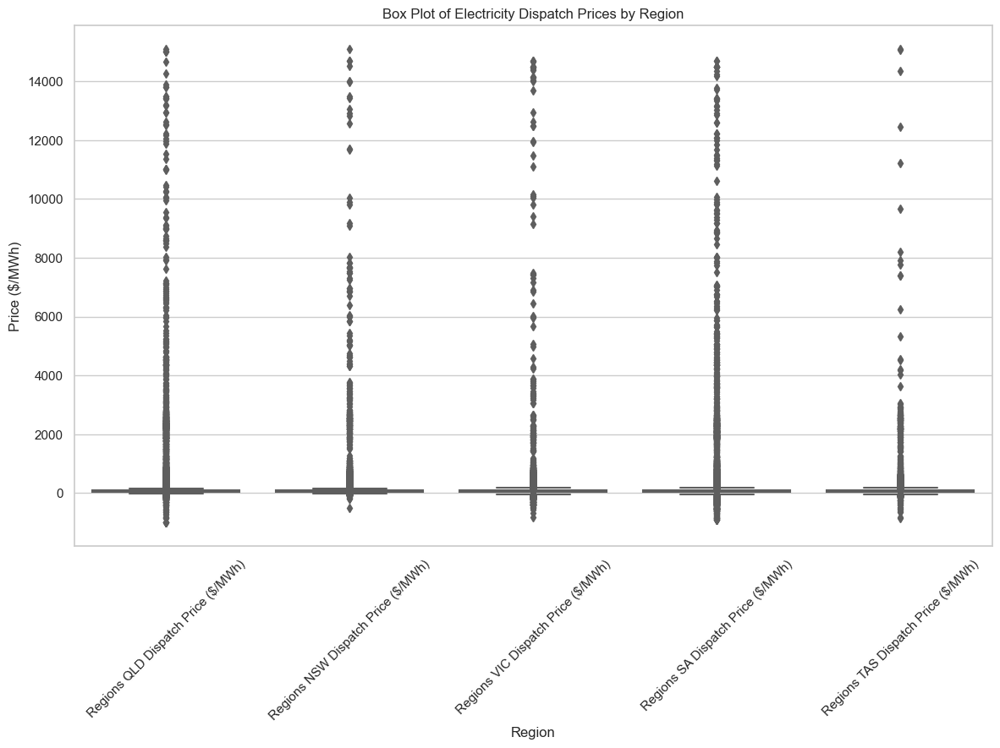

In [195]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetics for the plots
sns.set(style="whitegrid")

# Creating box plots for dispatch prices of each region
plt.figure(figsize=(14, 8))

# Plotting
sns.boxplot(data=data[price_columns], palette="vlag")
plt.xticks(rotation=45)
plt.title('Box Plot of Electricity Dispatch Prices by Region')
plt.ylabel('Price ($/MWh)')
plt.xlabel('Region')

plt.show()

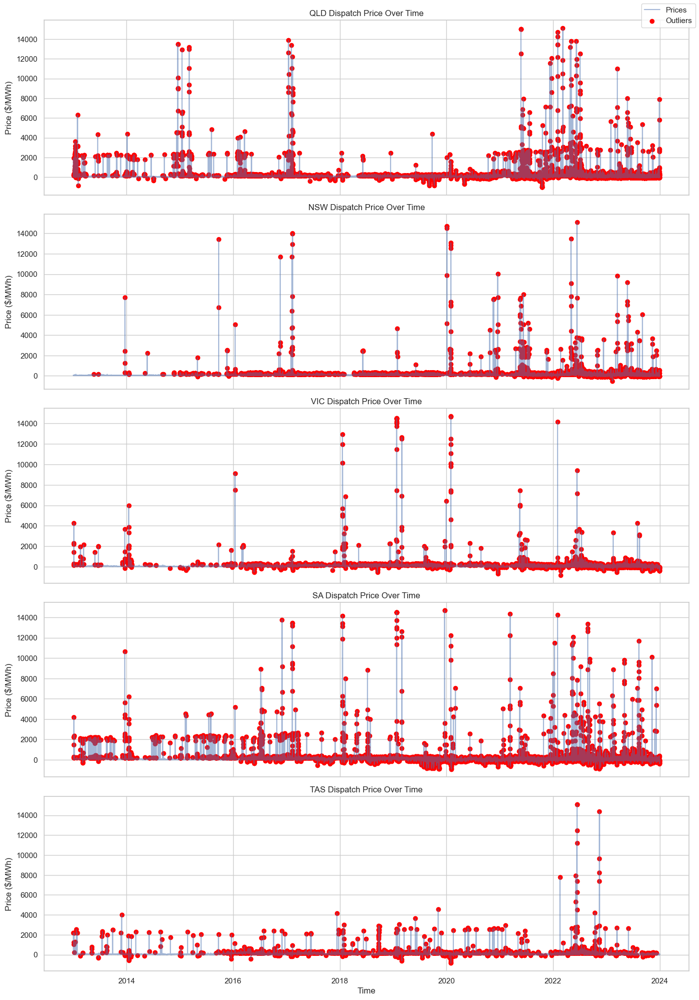

In [196]:
# Convert 'Time (UTC+10)' to datetime format for plotting
data['Time (UTC+10)'] = pd.to_datetime(data['Time (UTC+10)'])

# Plotting the dispatch price over time and highlighting outliers
fig, axs = plt.subplots(5, 1, figsize=(14, 20), sharex=True)

for i, column in enumerate(price_columns):
    region = column.split(' ')[1]
    
    # Calculate IQR and bounds for outliers
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identifying outliers
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    
    # Regular price data
    axs[i].plot(data['Time (UTC+10)'], data[column], 'b', alpha=0.5, label='Prices')
    
    # Highlighting outliers
    axs[i].scatter(outliers['Time (UTC+10)'], outliers[column], color='red', label='Outliers')
    
    axs[i].set_title(f'{region} Dispatch Price Over Time')
    axs[i].set_ylabel('Price ($/MWh)')
    
axs[-1].set_xlabel('Time')
fig.legend(['Prices', 'Outliers'], loc='upper right')
plt.tight_layout()
plt.show()

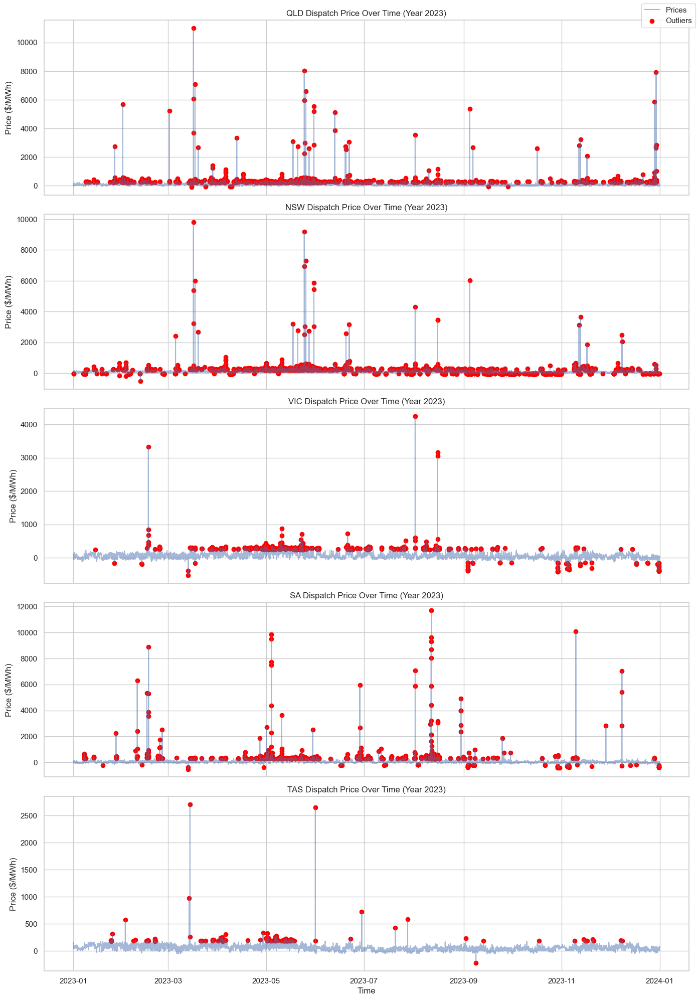

In [197]:
# Identify the year just before the latest one with sufficient data
previous_year = data['Year'].unique()[-2]  # Selecting the second to last unique year available in the dataset

# Filtering the dataset for this previous year
data_previous_year = data[data['Year'] == previous_year]

# Re-plotting the dispatch price over time for the previous year and highlighting outliers
fig, axs = plt.subplots(5, 1, figsize=(14, 20), sharex=True)

for i, column in enumerate(price_columns):
    region = column.split(' ')[1]
    
    # Calculate IQR and bounds for outliers for the previous year
    Q1 = data_previous_year[column].quantile(0.25)
    Q3 = data_previous_year[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identifying outliers for the previous year
    outliers_previous_year = data_previous_year[(data_previous_year[column] < lower_bound) | (data_previous_year[column] > upper_bound)]
    
    # Regular price data for the previous year
    axs[i].plot(data_previous_year['Time (UTC+10)'], data_previous_year[column], 'b', alpha=0.5, label='Prices')
    
    # Highlighting outliers for the previous year
    axs[i].scatter(outliers_previous_year['Time (UTC+10)'], outliers_previous_year[column], color='red', label='Outliers')
    
    axs[i].set_title(f'{region} Dispatch Price Over Time (Year {previous_year})')
    axs[i].set_ylabel('Price ($/MWh)')
    
axs[-1].set_xlabel('Time')
fig.legend(['Prices', 'Outliers'], loc='upper right')
plt.tight_layout()
plt.show()

## Let's now account for CAP options with stike of $300

Let's now modify the outlier cutoff to account for the industry CAP options which have a strike of $300/MWh

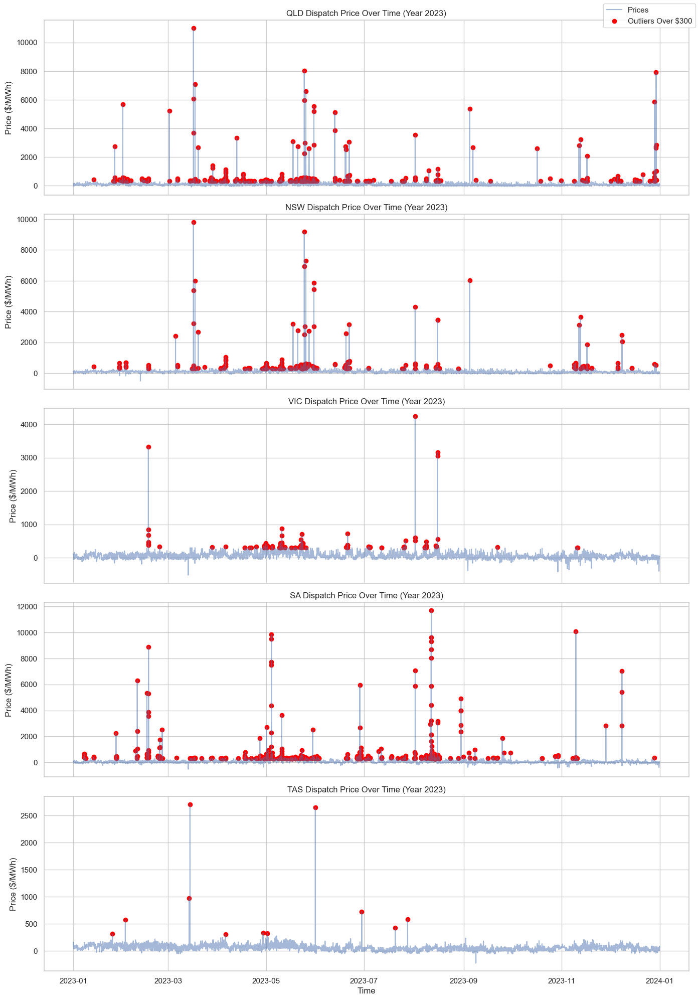

In [198]:
# Setting the outlier cutoff based on CAP options with $300/MWh strike.
outlier_cutoff = 300

# Plotting the dispatch price over time for the previous year and highlighting outliers with the new cutoff
fig, axs = plt.subplots(5, 1, figsize=(14, 20), sharex=True)

for i, column in enumerate(price_columns):
    region = column.split(' ')[1]
    
    # Identifying outliers based on the new cutoff for the previous year
    outliers_new_cutoff = data_previous_year[data_previous_year[column] > outlier_cutoff]
    
    # Regular price data for the previous year
    axs[i].plot(data_previous_year['Time (UTC+10)'], data_previous_year[column], 'b', alpha=0.5, label='Prices')
    
    # Highlighting outliers based on the new cutoff
    axs[i].scatter(outliers_new_cutoff['Time (UTC+10)'], outliers_new_cutoff[column], color='red', label='Outliers Over $300')
    
    axs[i].set_title(f'{region} Dispatch Price Over Time (Year {previous_year})')
    axs[i].set_ylabel('Price ($/MWh)')
    
axs[-1].set_xlabel('Time')
fig.legend(['Prices', 'Outliers Over $300'], loc='upper right')
plt.tight_layout()
plt.show()

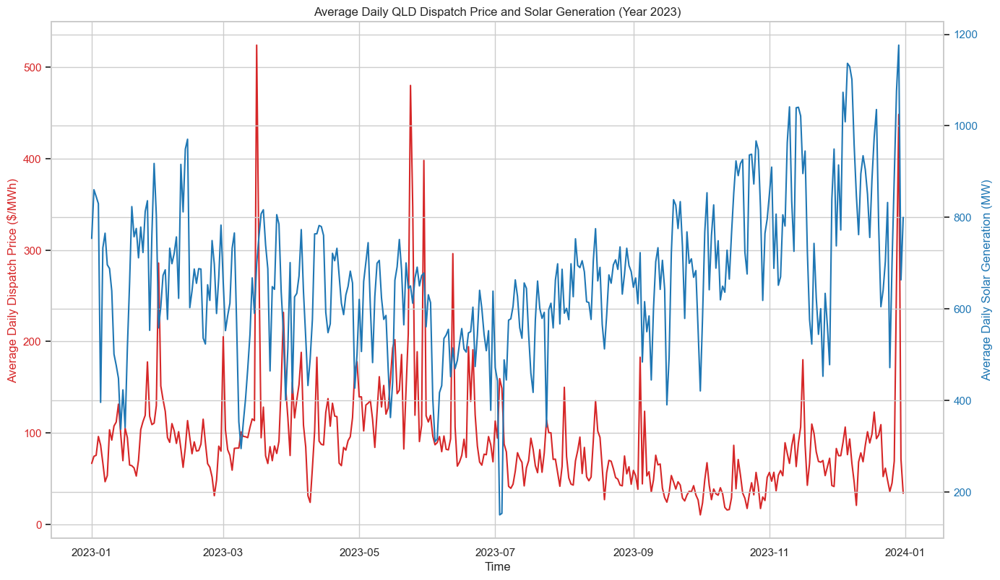

In [199]:
# Filter data for QLD and the previous year
qld_data = data_previous_year[['Time (UTC+10)', 'Regions QLD Dispatch Price ($/MWh)', 'Large Solar QLD1 Final MW (MW)']].dropna()

# Aggregating to average daily data for QLD
daily_qld_data = qld_data.resample('D', on='Time (UTC+10)').mean()

# Plotting average daily QLD dispatch price and solar generation
fig, ax1 = plt.subplots(figsize=(14, 8))

color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('Average Daily Dispatch Price ($/MWh)', color=color)
ax1.plot(daily_qld_data.index, daily_qld_data['Regions QLD Dispatch Price ($/MWh)'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Average Daily Solar Generation (MW)', color=color)
ax2.plot(daily_qld_data.index, daily_qld_data['Large Solar QLD1 Final MW (MW)'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Average Daily QLD Dispatch Price and Solar Generation (Year ' + str(previous_year) + ')')
plt.show()


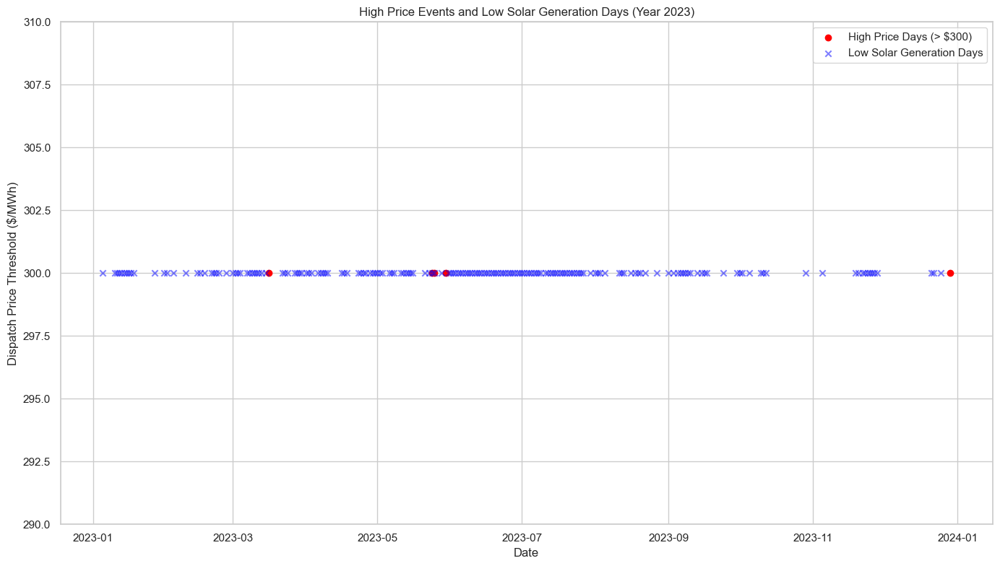

In [200]:
# Define 'low' solar generation as below median value
median_solar_generation = daily_qld_data['Large Solar QLD1 Final MW (MW)'].median()
low_solar_generation_days = daily_qld_data[daily_qld_data['Large Solar QLD1 Final MW (MW)'] < median_solar_generation].index

# Identify days with high prices
high_price_days = daily_qld_data[daily_qld_data['Regions QLD Dispatch Price ($/MWh)'] > 300].index

# Creating a new DataFrame to classify each day as having 'low' or 'high' solar generation
daily_qld_data['Solar Generation Level'] = 'High'
daily_qld_data.loc[daily_qld_data.index.isin(low_solar_generation_days), 'Solar Generation Level'] = 'Low'

# Plotting
plt.figure(figsize=(14, 8))

# Plotting high price days
plt.scatter(high_price_days, [300]*len(high_price_days), color='red', label='High Price Days (> $300)')

# Highlighting low solar generation days
plt.scatter(low_solar_generation_days, [300]*len(low_solar_generation_days), color='blue', alpha=0.5, label='Low Solar Generation Days', marker='x')

plt.legend()
plt.title('High Price Events and Low Solar Generation Days (Year ' + str(previous_year) + ')')
plt.xlabel('Date')
plt.ylabel('Dispatch Price Threshold ($/MWh)')
plt.ylim(290, 310)  # Focusing on the threshold area
plt.tight_layout()
plt.show()

# Calculating the overlap of high price days and low solar generation days
overlap_days_count = len(set(high_price_days).intersection(set(low_solar_generation_days)))
total_high_price_days = len(high_price_days)
overlap_ratio = overlap_days_count / total_high_price_days if total_high_price_days > 0 else 0

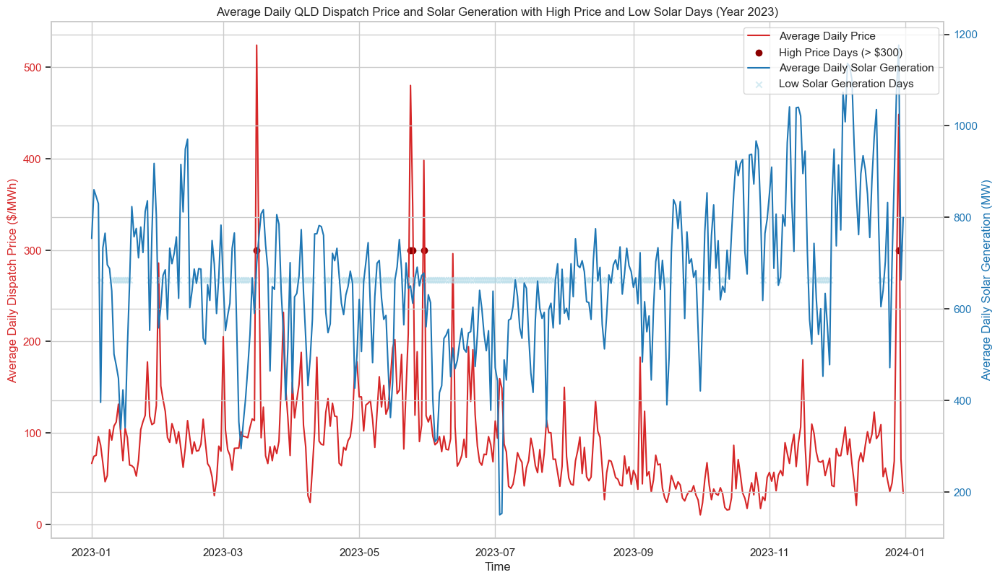

In [201]:
# Re-plotting average daily QLD dispatch price and solar generation with added visualization for high price and low solar generation days
fig, ax1 = plt.subplots(figsize=(14, 8))

# Plotting average daily dispatch price
color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('Average Daily Dispatch Price ($/MWh)', color=color)
price_plot, = ax1.plot(daily_qld_data.index, daily_qld_data['Regions QLD Dispatch Price ($/MWh)'], color=color, label='Average Daily Price')
ax1.tick_params(axis='y', labelcolor=color)

# Highlighting high price days
high_price_plot = ax1.scatter(high_price_days, [300]*len(high_price_days), color='darkred', label='High Price Days (> $300)')

# Solar generation plot on the same graph
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Average Daily Solar Generation (MW)', color=color)
solar_plot, = ax2.plot(daily_qld_data.index, daily_qld_data['Large Solar QLD1 Final MW (MW)'], color=color, label='Average Daily Solar Generation')
ax2.tick_params(axis='y', labelcolor=color)

# Highlighting low solar generation days
low_solar_plot = ax2.scatter(low_solar_generation_days, [median_solar_generation]*len(low_solar_generation_days), color='lightblue', alpha=0.5, label='Low Solar Generation Days', marker='x')

fig.tight_layout()
fig.legend(handles=[price_plot, high_price_plot, solar_plot, low_solar_plot], loc='upper right', bbox_to_anchor=(1,1), bbox_transform=ax1.transAxes)
plt.title('Average Daily QLD Dispatch Price and Solar Generation with High Price and Low Solar Days (Year ' + str(previous_year) + ')')
plt.show()

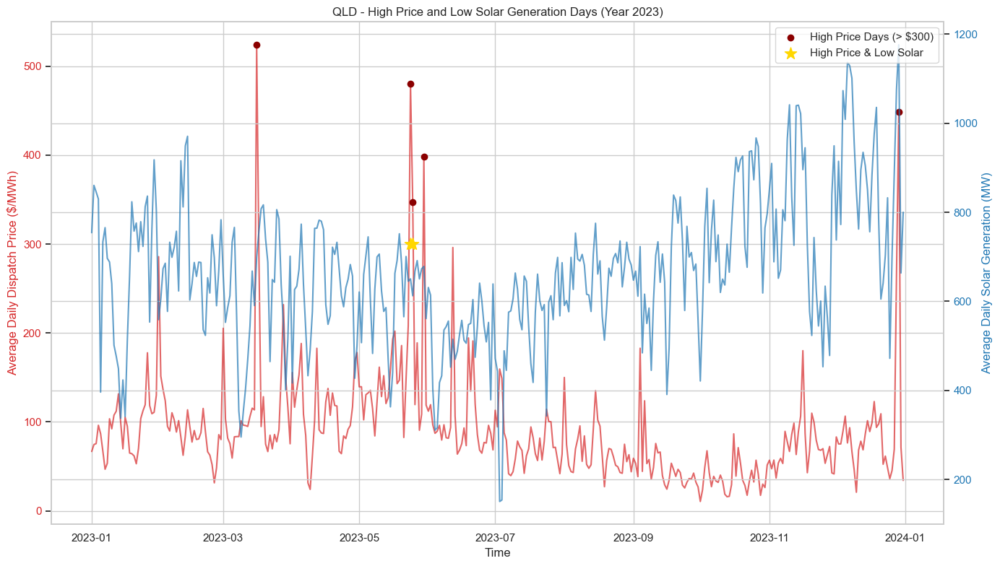

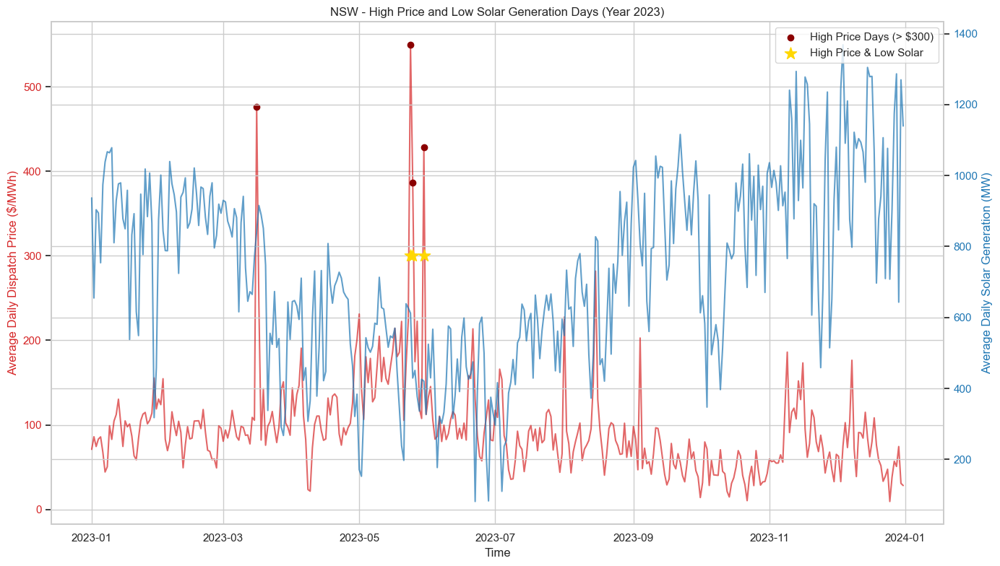

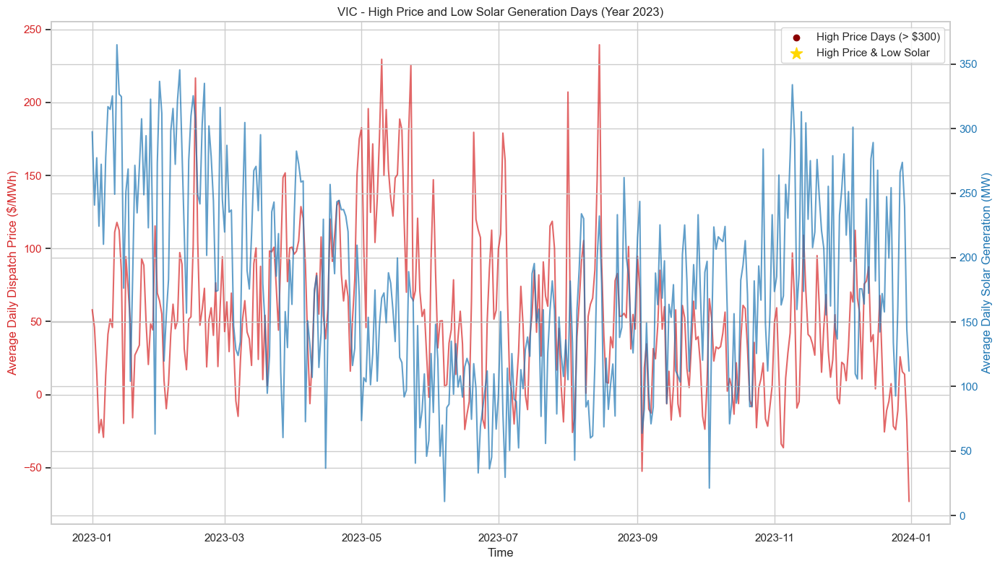

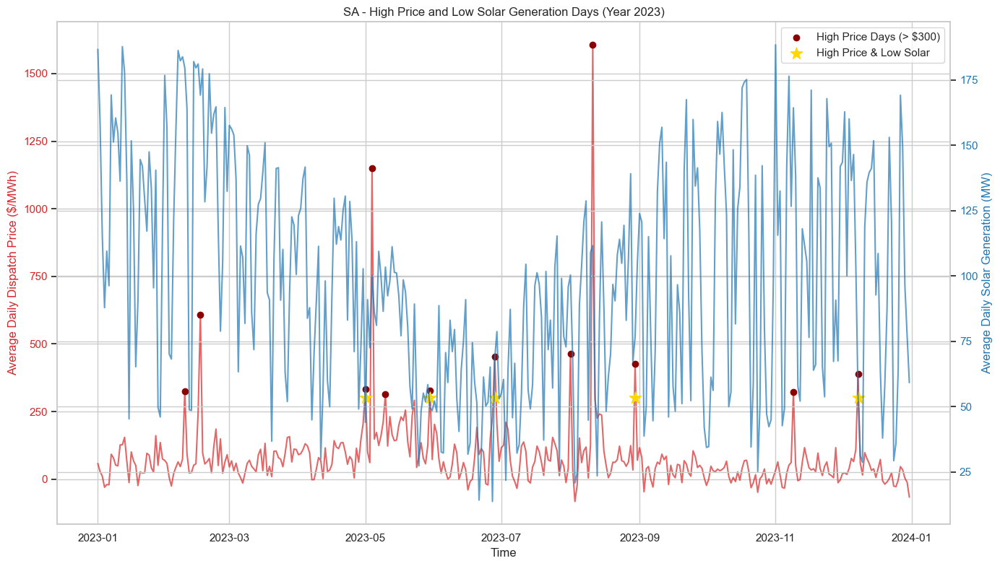

In [202]:
# List of state abbreviations to plot
states_to_plot = ['QLD', 'NSW', 'VIC', 'SA']

# Define a function to plot for a given state
def plot_for_state(state_abbreviation):
    # Filtering data for the specific state
    state_data = data_previous_year[['Time (UTC+10)', 
                                     f'Regions {state_abbreviation} Dispatch Price ($/MWh)', 
                                     f'Large Solar {state_abbreviation}1 Final MW (MW)']].dropna()

    # Aggregating to average daily data
    daily_state_data = state_data.resample('D', on='Time (UTC+10)').mean()

    # Identifying days with high prices
    high_price_days = daily_state_data[daily_state_data[f'Regions {state_abbreviation} Dispatch Price ($/MWh)'] > 300].index

    # Identifying low solar generation days
    median_solar_generation = daily_state_data[f'Large Solar {state_abbreviation}1 Final MW (MW)'].median()
    low_solar_generation_days = daily_state_data[daily_state_data[f'Large Solar {state_abbreviation}1 Final MW (MW)'] < median_solar_generation].index

    # Identifying days where both high prices and low solar generation occur
    overlap_days = set(high_price_days).intersection(set(low_solar_generation_days))

    # Plotting
    fig, ax1 = plt.subplots(figsize=(14, 8))

    # Average Daily Dispatch Price
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Average Daily Dispatch Price ($/MWh)', color='tab:red')
    ax1.plot(daily_state_data.index, daily_state_data[f'Regions {state_abbreviation} Dispatch Price ($/MWh)'], color='tab:red', alpha=0.7)
    ax1.tick_params(axis='y', labelcolor='tab:red')

    # Highlighting high price days
    ax1.scatter(high_price_days, daily_state_data.loc[high_price_days, f'Regions {state_abbreviation} Dispatch Price ($/MWh)'], color='darkred', label='High Price Days (> $300)', zorder=5)

    # Average Daily Solar Generation
    if f'Large Solar {state_abbreviation}1 Final MW (MW)' in daily_state_data.columns:
        ax2 = ax1.twinx()
        ax2.set_ylabel('Average Daily Solar Generation (MW)', color='tab:blue')
        ax2.plot(daily_state_data.index, daily_state_data[f'Large Solar {state_abbreviation}1 Final MW (MW)'], color='tab:blue', alpha=0.7)
        ax2.tick_params(axis='y', labelcolor='tab:blue')

    # Specifically highlighting overlap days with a star marker
    ax1.scatter(list(overlap_days), [300]*len(overlap_days), marker='*', s=150, color='gold', label='High Price & Low Solar', zorder=10)

    plt.title(f'{state_abbreviation} - High Price and Low Solar Generation Days (Year {previous_year})')
    fig.tight_layout()
    fig.legend(loc='upper right', bbox_to_anchor=(1, 1), bbox_transform=ax1.transAxes)
    plt.show()

# Plot for each state in the list
for state in states_to_plot:
    plot_for_state(state)

It is clear at this point that solar does not fully describe the price movements and more information is required such as other renewable generation.